# 1. Problem 🧐

Identify compound's property.

Data:
* CSV (IC50 values, MACCS keys, Klekota-Roth and PubChem substructure fingerprints)
* SDF (series of molfiles)

MACCS keys:
* List of 166 (keys) binary values (0 or 1) which characterize a molecule.
Details: https://github.com/rdkit/rdkit-orig/blob/master/rdkit/Chem/MACCSkeys.py

Klekota-Roth fingerprints:
* Set of 4860 chemical substructures (binary values).
Details: 

PubChem fingerprints:
* 881 binary bits (indicate the presence or absence of a certain group of chemical features in a compound).
Details: https://web.cse.ohio-state.edu/~zhang.10631/bak/drugreposition/list_fingerprints.pdf



### 1.1 Libraries 📖

In [1]:
import sys
sys.path.append('..')

import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler

from rdkit import Chem
from rdkit.Chem import AllChem
from rdkit.Chem import MolToSmiles

pd.set_option('display.max_columns', None)

colors_palette = ['#ffa600','#ff6361','#bc5090','#58508d', '#65345a']

### 1.2 Functions

In [2]:
def annotate(ax, fontsize=12):
    for p in ax.patches:
        ax.annotate(format(p.get_height(), ','), 
               (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'center', 
               xytext = (0, 6), textcoords = 'offset points', fontsize=fontsize)

# 2. Caco-2 permeability

## 2.1 Data Analyse and Preprocessing 📊

In [68]:
df_caco = pd.read_csv("data/raw/caco2_permeability_MACCSFP.csv" )
print("Examples: {0}, columns: {1}".format(df_caco.shape[0],df_caco.shape[1]))
df_caco.head()

Examples: 1241, columns: 167


,permeability,MACCSFP1,MACCSFP2,MACCSFP3,MACCSFP4,MACCSFP5,MACCSFP6,MACCSFP7,MACCSFP8,MACCSFP9,MACCSFP10,MACCSFP11,MACCSFP12,MACCSFP13,MACCSFP14,MACCSFP15,MACCSFP16,MACCSFP17,MACCSFP18,MACCSFP19,MACCSFP20,MACCSFP21,MACCSFP22,MACCSFP23,MACCSFP24,MACCSFP25,MACCSFP26,MACCSFP27,MACCSFP28,MACCSFP29,MACCSFP30,MACCSFP31,MACCSFP32,MACCSFP33,MACCSFP34,MACCSFP35,MACCSFP36,MACCSFP37,MACCSFP38,MACCSFP39,MACCSFP40,MACCSFP41,MACCSFP42,MACCSFP43,MACCSFP44,MACCSFP45,MACCSFP46,MACCSFP47,MACCSFP48,MACCSFP49,MACCSFP50,MACCSFP51,MACCSFP52,MACCSFP53,MACCSFP54,MACCSFP55,MACCSFP56,MACCSFP57,MACCSFP58,MACCSFP59,MACCSFP60,MACCSFP61,MACCSFP62,MACCSFP63,MACCSFP64,MACCSFP65,MACCSFP66,MACCSFP67,MACCSFP68,MACCSFP69,MACCSFP70,MACCSFP71,MACCSFP72,MACCSFP73,MACCSFP74,MACCSFP75,MACCSFP76,MACCSFP77,MACCSFP78,MACCSFP79,MACCSFP80,MACCSFP81,MACCSFP82,MACCSFP83,MACCSFP84,MACCSFP85,MACCSFP86,MACCSFP87,MACCSFP88,MACCSFP89,MACCSFP90,MACCSFP91,MACCSFP92,MACCSFP93,MACCSFP94,MACCSFP95,MACCSFP96,MACCSFP97,MACCSFP98,MACCSFP99,MACCSFP100,MACCSFP101,MACCSFP102,MACCSFP103,MACCSFP104,MACCSFP105,MACCSFP106,MACCSFP107,MACCSFP108,MACCSFP109,MACCSFP110,MACCSFP111,MACCSFP112,MACCSFP113,MACCSFP114,MACCSFP115,MACCSFP116,MACCSFP117,MACCSFP118,MACCSFP119,MACCSFP120,MACCSFP121,MACCSFP122,MACCSFP123,MACCSFP124,MACCSFP125,MACCSFP126,MACCSFP127,MACCSFP128,MACCSFP129,MACCSFP130,MACCSFP131,MACCSFP132,MACCSFP133,MACCSFP134,MACCSFP135,MACCSFP136,MACCSFP137,MACCSFP138,MACCSFP139,MACCSFP140,MACCSFP141,MACCSFP142,MACCSFP143,MACCSFP144,MACCSFP145,MACCSFP146,MACCSFP147,MACCSFP148,MACCSFP149,MACCSFP150,MACCSFP151,MACCSFP152,MACCSFP153,MACCSFP154,MACCSFP155,MACCSFP156,MACCSFP157,MACCSFP158,MACCSFP159,MACCSFP160,MACCSFP161,MACCSFP162,MACCSFP163,MACCSFP164,MACCSFP165,MACCSFP166
0,4.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,1,1,0,0,0,1,1,1,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,1,1,0,0,0,0,0,1,1,0,1,1,1,0,0,1,0,0,1,1,0,0,0,0,0,0,1,1,1,0,0,0,1,0,1,1,0,1,1,1,1,1,0,1,1,1,1,0,1,1,1,1,1,1,1,1,0
1,200.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,1,1,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,1,1,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,1,1,1,0,1,0,0,0,0,1,0,0,1,0,1,0,0,0,1,0,0,0,0,1,0,1,0,0,1,1,1,0,1,0
2,2.1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,1,0,0,0,0,0,1,0,0,1,0,1,0,1,1,0,1,0,1,1,0,1,0,0,0,1,1,1,0,1,0,0,1,0,1,0,0,0,1,1,1,1,1,0,1,1,1,1,1,0,0,1,1,0,1,1,1,1,0,1,1,1,0,0,0,1,0,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0
3,2.6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,1,1,0,0,1,1,0,1,0,0,0,0,0,1,0,1,0,1,0,1,1,1,1,1,0,1,1,0,1,0,1,1,0,1,1,1,1,0,1,0,1,0,1,0,1,1,1,0,0,1,1,1,1,0,1,0,1,1,1,0,1,1,1,1,1,1,1,0,1,1,1,0,0,1,0,1,1,1,1,0,1,0,1,0,1,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,0
4,0.5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,1,1,0,0,1,1,1,1,0,0,0,0,0,1,1,1,0,1,0,1,1,1,1,1,0,1,1,0,1,0,1,1,1,1,1,1,1,0,1,0,1,0,1,0,1,1,1,0,0,0,1,1,1,0,0,1,1,1,1,0,1,1,1,0,1,1,0,0,1,1,1,0,1,1,0,1,1,1,1,0,0,1,1,0,1,1,1,1,1,1,1,1,0,1,1,1,1,0,1,1,1,1,1,1,1,1,0


In [69]:
df_caco_papp = pd.read_csv("data/raw/caco2_permeability_papp_MACCSFP.csv" )
print("Examples: {0}, columns: {1}".format(df_caco_papp.shape[0],df_caco_papp.shape[1]))
df_caco_papp.head()

Examples: 2400, columns: 167


,permetability_papp,MACCSFP1,MACCSFP2,MACCSFP3,MACCSFP4,MACCSFP5,MACCSFP6,MACCSFP7,MACCSFP8,MACCSFP9,MACCSFP10,MACCSFP11,MACCSFP12,MACCSFP13,MACCSFP14,MACCSFP15,MACCSFP16,MACCSFP17,MACCSFP18,MACCSFP19,MACCSFP20,MACCSFP21,MACCSFP22,MACCSFP23,MACCSFP24,MACCSFP25,MACCSFP26,MACCSFP27,MACCSFP28,MACCSFP29,MACCSFP30,MACCSFP31,MACCSFP32,MACCSFP33,MACCSFP34,MACCSFP35,MACCSFP36,MACCSFP37,MACCSFP38,MACCSFP39,MACCSFP40,MACCSFP41,MACCSFP42,MACCSFP43,MACCSFP44,MACCSFP45,MACCSFP46,MACCSFP47,MACCSFP48,MACCSFP49,MACCSFP50,MACCSFP51,MACCSFP52,MACCSFP53,MACCSFP54,MACCSFP55,MACCSFP56,MACCSFP57,MACCSFP58,MACCSFP59,MACCSFP60,MACCSFP61,MACCSFP62,MACCSFP63,MACCSFP64,MACCSFP65,MACCSFP66,MACCSFP67,MACCSFP68,MACCSFP69,MACCSFP70,MACCSFP71,MACCSFP72,MACCSFP73,MACCSFP74,MACCSFP75,MACCSFP76,MACCSFP77,MACCSFP78,MACCSFP79,MACCSFP80,MACCSFP81,MACCSFP82,MACCSFP83,MACCSFP84,MACCSFP85,MACCSFP86,MACCSFP87,MACCSFP88,MACCSFP89,MACCSFP90,MACCSFP91,MACCSFP92,MACCSFP93,MACCSFP94,MACCSFP95,MACCSFP96,MACCSFP97,MACCSFP98,MACCSFP99,MACCSFP100,MACCSFP101,MACCSFP102,MACCSFP103,MACCSFP104,MACCSFP105,MACCSFP106,MACCSFP107,MACCSFP108,MACCSFP109,MACCSFP110,MACCSFP111,MACCSFP112,MACCSFP113,MACCSFP114,MACCSFP115,MACCSFP116,MACCSFP117,MACCSFP118,MACCSFP119,MACCSFP120,MACCSFP121,MACCSFP122,MACCSFP123,MACCSFP124,MACCSFP125,MACCSFP126,MACCSFP127,MACCSFP128,MACCSFP129,MACCSFP130,MACCSFP131,MACCSFP132,MACCSFP133,MACCSFP134,MACCSFP135,MACCSFP136,MACCSFP137,MACCSFP138,MACCSFP139,MACCSFP140,MACCSFP141,MACCSFP142,MACCSFP143,MACCSFP144,MACCSFP145,MACCSFP146,MACCSFP147,MACCSFP148,MACCSFP149,MACCSFP150,MACCSFP151,MACCSFP152,MACCSFP153,MACCSFP154,MACCSFP155,MACCSFP156,MACCSFP157,MACCSFP158,MACCSFP159,MACCSFP160,MACCSFP161,MACCSFP162,MACCSFP163,MACCSFP164,MACCSFP165,MACCSFP166
0,240.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,1,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,1,1,0,0,1,1,0,0,0,0,0,1,1,0,0,0,1,1,0,0,0,0,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,0
1,0.58,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,1,1,0,0,0,1,1,1,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,1,0,0,0,1,1,1,0,0,0,0,1,0,0,1,0,0,1,1,0,1,1,0,0,0,1,0,1,0,1,1,1,0,0,1,1,0,1,1,0,1,0,1,1,1,1,0,1,1,1,1,1,1,1,1,0
2,2.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,1,0,1,0,0,1,1,1,0,0,0,0,1,1,0,1,0,0,1,0,1,0,0,1,1,0,0,1,1,0,1,1,0,1,0,1,0,1,1,0,1,1,1,0,0,1,1,1,1,1,0,1,1,1,1,1,1,1,1,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0
3,31.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,1,0,1,1,1,1,1,1,0,1,1,1,1,0,1,0,0,0,1,1,0,0,1,0,1,1,1,1,0,0,0,0,1,1,1,1,1,1,1,1,1,0,0,1,0,1,0,1,0,1,1,1,1,1,1,1,1,1,1,0,1,1,1,1,0,1,1,0,0,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,1,1,1,1,1,1,1,1,1,1,0
4,34.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,1,1,1,1,1,0,1,1,0,1,0,1,0,0,0,1,0,0,0,1,0,1,1,1,1,0,0,0,0,1,1,0,1,1,1,1,1,1,0,0,1,0,1,0,1,0,1,1,1,1,1,0,1,1,1,1,0,0,0,1,0,0,1,1,0,0,1,1,1,1,1,0,1,1,0,1,1,0,1,1,0,0,1,0,1,1,1,1,1,0,1,1,1,1,1,1,0,0,1,1,1,1,1,1,1,1,1,1,0


In [70]:
df_caco_pubch = pd.read_csv("data/raw/caco2_permeability_PubchemFP.csv")
print("Examples: {0}, columns: {1}".format(df_caco_pubch.shape[0],df_caco_pubch.shape[1]))
df_caco_pubch.head()

Examples: 1241, columns: 882


,permeability,PubchemFP0,PubchemFP1,PubchemFP2,PubchemFP3,PubchemFP4,PubchemFP5,PubchemFP6,PubchemFP7,PubchemFP8,PubchemFP9,PubchemFP10,PubchemFP11,PubchemFP12,PubchemFP13,PubchemFP14,PubchemFP15,PubchemFP16,PubchemFP17,PubchemFP18,PubchemFP19,PubchemFP20,PubchemFP21,PubchemFP22,PubchemFP23,PubchemFP24,PubchemFP25,PubchemFP26,PubchemFP27,PubchemFP28,PubchemFP29,PubchemFP30,PubchemFP31,PubchemFP32,PubchemFP33,PubchemFP34,PubchemFP35,PubchemFP36,PubchemFP37,PubchemFP38,PubchemFP39,PubchemFP40,PubchemFP41,PubchemFP42,PubchemFP43,PubchemFP44,PubchemFP45,PubchemFP46,PubchemFP47,PubchemFP48,PubchemFP49,PubchemFP50,PubchemFP51,PubchemFP52,PubchemFP53,PubchemFP54,PubchemFP55,PubchemFP56,PubchemFP57,PubchemFP58,PubchemFP59,PubchemFP60,PubchemFP61,PubchemFP62,PubchemFP63,PubchemFP64,PubchemFP65,PubchemFP66,PubchemFP67,PubchemFP68,PubchemFP69,PubchemFP70,PubchemFP71,PubchemFP72,PubchemFP73,PubchemFP74,PubchemFP75,PubchemFP76,PubchemFP77,PubchemFP78,PubchemFP79,PubchemFP80,PubchemFP81,PubchemFP82,PubchemFP83,PubchemFP84,PubchemFP85,PubchemFP86,PubchemFP87,PubchemFP88,PubchemFP89,PubchemFP90,PubchemFP91,PubchemFP92,PubchemFP93,PubchemFP94,PubchemFP95,PubchemFP96,PubchemFP97,PubchemFP98,PubchemFP99,PubchemFP100,PubchemFP101,PubchemFP102,PubchemFP103,PubchemFP104,PubchemFP105,PubchemFP106,PubchemFP107,PubchemFP108,PubchemFP109,PubchemFP110,PubchemFP111,PubchemFP112,PubchemFP113,PubchemFP114,PubchemFP115,PubchemFP116,PubchemFP117,PubchemFP118,PubchemFP119,PubchemFP120,PubchemFP121,PubchemFP122,PubchemFP123,PubchemFP124,PubchemFP125,PubchemFP126,PubchemFP127,PubchemFP128,PubchemFP129,PubchemFP130,PubchemFP131,PubchemFP132,PubchemFP133,PubchemFP134,PubchemFP135,PubchemFP136,PubchemFP137,PubchemFP138,PubchemFP139,PubchemFP140,PubchemFP141,PubchemFP142,PubchemFP143,PubchemFP144,PubchemFP145,PubchemFP146,PubchemFP147,PubchemFP148,PubchemFP149,PubchemFP150,PubchemFP151,PubchemFP152,PubchemFP153,PubchemFP154,PubchemFP155,PubchemFP156,PubchemFP157,PubchemFP158,PubchemFP159,PubchemFP160,PubchemFP161,PubchemFP162,PubchemFP163,PubchemFP164,PubchemFP165,PubchemFP166,PubchemFP167,PubchemFP168,PubchemFP169,PubchemFP170,PubchemFP171,PubchemFP172,PubchemFP173,PubchemFP174,PubchemFP175,PubchemFP176,PubchemFP177,PubchemFP178,PubchemFP179,PubchemFP180,PubchemFP181,PubchemFP182,PubchemFP183,PubchemFP184,PubchemFP185,PubchemFP186,PubchemFP187,PubchemFP188,PubchemFP189,PubchemFP190,PubchemFP191,PubchemFP192,PubchemFP193,PubchemFP194,PubchemFP195,PubchemFP196,PubchemFP197,PubchemFP198,PubchemFP199,PubchemFP200,PubchemFP201,PubchemFP202,PubchemFP203,PubchemFP204,PubchemFP205,PubchemFP206,PubchemFP207,PubchemFP208,PubchemFP209,PubchemFP210,PubchemFP211,PubchemFP212,PubchemFP213,PubchemFP214,PubchemFP215,PubchemFP216,PubchemFP217,PubchemFP218,PubchemFP219,PubchemFP220,PubchemFP221,PubchemFP222,PubchemFP223,PubchemFP224,PubchemFP225,PubchemFP226,PubchemFP227,PubchemFP228,PubchemFP229,PubchemFP230,PubchemFP231,PubchemFP232,PubchemFP233,PubchemFP234,PubchemFP235,PubchemFP236,PubchemFP237,PubchemFP238,PubchemFP239,PubchemFP240,PubchemFP241,PubchemFP242,PubchemFP243,PubchemFP244,PubchemFP245,PubchemFP246,PubchemFP247,PubchemFP248,PubchemFP249,PubchemFP250,PubchemFP251,PubchemFP252,PubchemFP253,PubchemFP254,PubchemFP255,PubchemFP256,PubchemFP257,PubchemFP258,PubchemFP259,PubchemFP260,PubchemFP261,PubchemFP262,PubchemFP263,PubchemFP264,PubchemFP265,PubchemFP266,PubchemFP267,PubchemFP268,PubchemFP269,PubchemFP270,PubchemFP271,PubchemFP272,PubchemFP273,PubchemFP274,PubchemFP275,PubchemFP276,PubchemFP277,PubchemFP278,PubchemFP279,PubchemFP280,PubchemFP281,PubchemFP282,PubchemFP283,PubchemFP284,PubchemFP285,PubchemFP286,PubchemFP287,PubchemFP288,PubchemFP289,PubchemFP290,PubchemFP291,PubchemFP292,PubchemFP293,PubchemFP294,PubchemFP295,PubchemFP296,PubchemFP297,PubchemFP298,PubchemFP299,PubchemFP300,PubchemFP301,PubchemFP302,PubchemFP303,PubchemFP304,PubchemFP305,PubchemFP306,PubchemFP307,PubchemFP308,PubchemFP309,PubchemFP310,PubchemFP311,PubchemFP312,PubchemFP313,PubchemFP314,P

In [71]:
df_caco_papp_pubch = pd.read_csv("data/raw/caco2_permeability_papp_PubchemFP.csv")
print("Examples: {0}, columns: {1}".format(df_caco_papp_pubch.shape[0],df_caco_papp_pubch.shape[1]))
df_caco_papp_pubch.head()

Examples: 2400, columns: 882


,permetability_papp,PubchemFP0,PubchemFP1,PubchemFP2,PubchemFP3,PubchemFP4,PubchemFP5,PubchemFP6,PubchemFP7,PubchemFP8,PubchemFP9,PubchemFP10,PubchemFP11,PubchemFP12,PubchemFP13,PubchemFP14,PubchemFP15,PubchemFP16,PubchemFP17,PubchemFP18,PubchemFP19,PubchemFP20,PubchemFP21,PubchemFP22,PubchemFP23,PubchemFP24,PubchemFP25,PubchemFP26,PubchemFP27,PubchemFP28,PubchemFP29,PubchemFP30,PubchemFP31,PubchemFP32,PubchemFP33,PubchemFP34,PubchemFP35,PubchemFP36,PubchemFP37,PubchemFP38,PubchemFP39,PubchemFP40,PubchemFP41,PubchemFP42,PubchemFP43,PubchemFP44,PubchemFP45,PubchemFP46,PubchemFP47,PubchemFP48,PubchemFP49,PubchemFP50,PubchemFP51,PubchemFP52,PubchemFP53,PubchemFP54,PubchemFP55,PubchemFP56,PubchemFP57,PubchemFP58,PubchemFP59,PubchemFP60,PubchemFP61,PubchemFP62,PubchemFP63,PubchemFP64,PubchemFP65,PubchemFP66,PubchemFP67,PubchemFP68,PubchemFP69,PubchemFP70,PubchemFP71,PubchemFP72,PubchemFP73,PubchemFP74,PubchemFP75,PubchemFP76,PubchemFP77,PubchemFP78,PubchemFP79,PubchemFP80,PubchemFP81,PubchemFP82,PubchemFP83,PubchemFP84,PubchemFP85,PubchemFP86,PubchemFP87,PubchemFP88,PubchemFP89,PubchemFP90,PubchemFP91,PubchemFP92,PubchemFP93,PubchemFP94,PubchemFP95,PubchemFP96,PubchemFP97,PubchemFP98,PubchemFP99,PubchemFP100,PubchemFP101,PubchemFP102,PubchemFP103,PubchemFP104,PubchemFP105,PubchemFP106,PubchemFP107,PubchemFP108,PubchemFP109,PubchemFP110,PubchemFP111,PubchemFP112,PubchemFP113,PubchemFP114,PubchemFP115,PubchemFP116,PubchemFP117,PubchemFP118,PubchemFP119,PubchemFP120,PubchemFP121,PubchemFP122,PubchemFP123,PubchemFP124,PubchemFP125,PubchemFP126,PubchemFP127,PubchemFP128,PubchemFP129,PubchemFP130,PubchemFP131,PubchemFP132,PubchemFP133,PubchemFP134,PubchemFP135,PubchemFP136,PubchemFP137,PubchemFP138,PubchemFP139,PubchemFP140,PubchemFP141,PubchemFP142,PubchemFP143,PubchemFP144,PubchemFP145,PubchemFP146,PubchemFP147,PubchemFP148,PubchemFP149,PubchemFP150,PubchemFP151,PubchemFP152,PubchemFP153,PubchemFP154,PubchemFP155,PubchemFP156,PubchemFP157,PubchemFP158,PubchemFP159,PubchemFP160,PubchemFP161,PubchemFP162,PubchemFP163,PubchemFP164,PubchemFP165,PubchemFP166,PubchemFP167,PubchemFP168,PubchemFP169,PubchemFP170,PubchemFP171,PubchemFP172,PubchemFP173,PubchemFP174,PubchemFP175,PubchemFP176,PubchemFP177,PubchemFP178,PubchemFP179,PubchemFP180,PubchemFP181,PubchemFP182,PubchemFP183,PubchemFP184,PubchemFP185,PubchemFP186,PubchemFP187,PubchemFP188,PubchemFP189,PubchemFP190,PubchemFP191,PubchemFP192,PubchemFP193,PubchemFP194,PubchemFP195,PubchemFP196,PubchemFP197,PubchemFP198,PubchemFP199,PubchemFP200,PubchemFP201,PubchemFP202,PubchemFP203,PubchemFP204,PubchemFP205,PubchemFP206,PubchemFP207,PubchemFP208,PubchemFP209,PubchemFP210,PubchemFP211,PubchemFP212,PubchemFP213,PubchemFP214,PubchemFP215,PubchemFP216,PubchemFP217,PubchemFP218,PubchemFP219,PubchemFP220,PubchemFP221,PubchemFP222,PubchemFP223,PubchemFP224,PubchemFP225,PubchemFP226,PubchemFP227,PubchemFP228,PubchemFP229,PubchemFP230,PubchemFP231,PubchemFP232,PubchemFP233,PubchemFP234,PubchemFP235,PubchemFP236,PubchemFP237,PubchemFP238,PubchemFP239,PubchemFP240,PubchemFP241,PubchemFP242,PubchemFP243,PubchemFP244,PubchemFP245,PubchemFP246,PubchemFP247,PubchemFP248,PubchemFP249,PubchemFP250,PubchemFP251,PubchemFP252,PubchemFP253,PubchemFP254,PubchemFP255,PubchemFP256,PubchemFP257,PubchemFP258,PubchemFP259,PubchemFP260,PubchemFP261,PubchemFP262,PubchemFP263,PubchemFP264,PubchemFP265,PubchemFP266,PubchemFP267,PubchemFP268,PubchemFP269,PubchemFP270,PubchemFP271,PubchemFP272,PubchemFP273,PubchemFP274,PubchemFP275,PubchemFP276,PubchemFP277,PubchemFP278,PubchemFP279,PubchemFP280,PubchemFP281,PubchemFP282,PubchemFP283,PubchemFP284,PubchemFP285,PubchemFP286,PubchemFP287,PubchemFP288,PubchemFP289,PubchemFP290,PubchemFP291,PubchemFP292,PubchemFP293,PubchemFP294,PubchemFP295,PubchemFP296,PubchemFP297,PubchemFP298,PubchemFP299,PubchemFP300,PubchemFP301,PubchemFP302,PubchemFP303,PubchemFP304,PubchemFP305,PubchemFP306,PubchemFP307,PubchemFP308,PubchemFP309,PubchemFP310,PubchemFP311,PubchemFP312,PubchemFP313,PubchemF

In [72]:
df_caco_klek = pd.read_csv("data/raw/caco2_permeability_KlekFP.csv")
print("Examples: {0}, columns: {1}".format(df_caco_klek.shape[0],df_caco_klek.shape[1]))
df_caco_klek.head()

Examples: 1241, columns: 4861


permeability  KRFP1  KRFP2  KRFP3  KRFP4  KRFP5  KRFP6  KRFP7  KRFP8  \
0           4.0      1      1      0      0      0      0      0      0   
1         200.0      1      0      0      0      0      0      0      0   
2           2.1      0      0      0      0      0      0      0      0   
3           2.6      1      0      0      0      0      0      0      0   
4           0.5      1      0      0      0      0      0      0      0   

   KRFP9  KRFP10  KRFP11  KRFP12  KRFP13  KRFP14  KRFP15  KRFP16  KRFP17  \
0      0       0       0       0       0       0       0       1       0   
1      0       0       0       0       0       0       0       0       0   
2      0       0       0       0       0       0       0       0       0   
3      0       0       0       0       0       0       0       0       0   
4      0       0       0       0       0       0       0       0       0   

   KRFP18  KRFP19  KRFP20  KRFP21  KRFP22  KRFP23  KRFP24  KRFP25  KRFP26  \
0       0       0       1       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP27  KRFP28  KRFP29  KRFP30  KRFP31  KRFP32  KRFP33  KRFP34  KRFP35  \
0       0       0       0       0       0       0       1       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP36  KRFP37  KRFP38  KRFP39  KRFP40  KRFP41  KRFP42  KRFP43  KRFP44  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP45  KRFP46  KRFP47  KRFP48  KRFP49  KRFP50  KRFP51  KRFP52  KRFP53  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP54  KRFP55  KRFP56  KRFP57  KRFP58  KRFP59  KRFP60  KRFP61  KRFP62  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP63  KRFP64  KRFP65  KRFP66  KRFP67  KRFP68  KRFP69  KRFP70  KRFP71  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP72  KRFP73  KRFP74  KRFP75  KRFP76  KRFP77  KRFP78  KRFP79  KRFP80  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0

In [73]:
df_caco_papp_klek = pd.read_csv("data/raw/caco2_permeability_papp_KlekFP.csv")
print("Examples: {0}, columns: {1}".format(df_caco_papp_klek.shape[0],df_caco_papp_klek.shape[1]))
df_caco_papp_klek.head()

Examples: 2400, columns: 4861


permetability_papp  KRFP1  KRFP2  KRFP3  KRFP4  KRFP5  KRFP6  KRFP7  KRFP8  \
0              240.00      1      0      0      0      0      0      0      0   
1                0.58      1      0      0      0      0      0      0      0   
2                2.00      1      1      0      0      0      0      0      0   
3               31.00      1      1      0      0      0      0      0      0   
4               34.00      1      1      0      0      0      0      0      0   

   KRFP9  KRFP10  KRFP11  KRFP12  KRFP13  KRFP14  KRFP15  KRFP16  KRFP17  \
0      0       0       0       0       0       1       0       0       1   
1      0       0       0       0       0       0       0       0       0   
2      0       0       0       0       0       1       0       1       0   
3      0       0       0       0       0       0       0       0       0   
4      0       0       0       0       0       0       0       0       0   

   KRFP18  KRFP19  KRFP20  KRFP21  KRFP22  KRFP23  KRFP24  KRFP25  KRFP26  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       1       0       0       0       0       0       0   
2       0       0       1       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP27  KRFP28  KRFP29  KRFP30  KRFP31  KRFP32  KRFP33  KRFP34  KRFP35  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP36  KRFP37  KRFP38  KRFP39  KRFP40  KRFP41  KRFP42  KRFP43  KRFP44  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP45  KRFP46  KRFP47  KRFP48  KRFP49  KRFP50  KRFP51  KRFP52  KRFP53  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP54  KRFP55  KRFP56  KRFP57  KRFP58  KRFP59  KRFP60  KRFP61  KRFP62  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP63  KRFP64  KRFP65  KRFP66  KRFP67  KRFP68  KRFP69  KRFP70  KRFP71  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       1       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP72  KRFP73  KRFP74  KRFP75  KRFP76  KRFP77  KRFP78  KRFP79  KRFP80  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0 

In [74]:
df_caco_papp.rename({'permetability_papp': 'permeability'}, axis=1, inplace=True)
df_caco_papp_pubch.rename({'permetability_papp': 'permeability'}, axis=1, inplace=True)
df_caco_papp_klek.rename({'permetability_papp': 'permeability'}, axis=1, inplace=True)
print(df_caco_papp.columns[0])
print(df_caco_papp_pubch.columns[0])
print(df_caco_papp_klek.columns[0])

permeability
permeability
permeability


In [75]:
df_caco_all = pd.concat([df_caco, df_caco_papp], ignore_index=True)
print("Examples: {0}, columns: {1}".format(df_caco_all.shape[0],df_caco_all.shape[1]))
df_caco_all.head()

Examples: 3641, columns: 167


,permeability,MACCSFP1,MACCSFP2,MACCSFP3,MACCSFP4,MACCSFP5,MACCSFP6,MACCSFP7,MACCSFP8,MACCSFP9,MACCSFP10,MACCSFP11,MACCSFP12,MACCSFP13,MACCSFP14,MACCSFP15,MACCSFP16,MACCSFP17,MACCSFP18,MACCSFP19,MACCSFP20,MACCSFP21,MACCSFP22,MACCSFP23,MACCSFP24,MACCSFP25,MACCSFP26,MACCSFP27,MACCSFP28,MACCSFP29,MACCSFP30,MACCSFP31,MACCSFP32,MACCSFP33,MACCSFP34,MACCSFP35,MACCSFP36,MACCSFP37,MACCSFP38,MACCSFP39,MACCSFP40,MACCSFP41,MACCSFP42,MACCSFP43,MACCSFP44,MACCSFP45,MACCSFP46,MACCSFP47,MACCSFP48,MACCSFP49,MACCSFP50,MACCSFP51,MACCSFP52,MACCSFP53,MACCSFP54,MACCSFP55,MACCSFP56,MACCSFP57,MACCSFP58,MACCSFP59,MACCSFP60,MACCSFP61,MACCSFP62,MACCSFP63,MACCSFP64,MACCSFP65,MACCSFP66,MACCSFP67,MACCSFP68,MACCSFP69,MACCSFP70,MACCSFP71,MACCSFP72,MACCSFP73,MACCSFP74,MACCSFP75,MACCSFP76,MACCSFP77,MACCSFP78,MACCSFP79,MACCSFP80,MACCSFP81,MACCSFP82,MACCSFP83,MACCSFP84,MACCSFP85,MACCSFP86,MACCSFP87,MACCSFP88,MACCSFP89,MACCSFP90,MACCSFP91,MACCSFP92,MACCSFP93,MACCSFP94,MACCSFP95,MACCSFP96,MACCSFP97,MACCSFP98,MACCSFP99,MACCSFP100,MACCSFP101,MACCSFP102,MACCSFP103,MACCSFP104,MACCSFP105,MACCSFP106,MACCSFP107,MACCSFP108,MACCSFP109,MACCSFP110,MACCSFP111,MACCSFP112,MACCSFP113,MACCSFP114,MACCSFP115,MACCSFP116,MACCSFP117,MACCSFP118,MACCSFP119,MACCSFP120,MACCSFP121,MACCSFP122,MACCSFP123,MACCSFP124,MACCSFP125,MACCSFP126,MACCSFP127,MACCSFP128,MACCSFP129,MACCSFP130,MACCSFP131,MACCSFP132,MACCSFP133,MACCSFP134,MACCSFP135,MACCSFP136,MACCSFP137,MACCSFP138,MACCSFP139,MACCSFP140,MACCSFP141,MACCSFP142,MACCSFP143,MACCSFP144,MACCSFP145,MACCSFP146,MACCSFP147,MACCSFP148,MACCSFP149,MACCSFP150,MACCSFP151,MACCSFP152,MACCSFP153,MACCSFP154,MACCSFP155,MACCSFP156,MACCSFP157,MACCSFP158,MACCSFP159,MACCSFP160,MACCSFP161,MACCSFP162,MACCSFP163,MACCSFP164,MACCSFP165,MACCSFP166
0,4.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,1,1,0,0,0,1,1,1,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,1,1,0,0,0,0,0,1,1,0,1,1,1,0,0,1,0,0,1,1,0,0,0,0,0,0,1,1,1,0,0,0,1,0,1,1,0,1,1,1,1,1,0,1,1,1,1,0,1,1,1,1,1,1,1,1,0
1,200.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,1,1,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,1,1,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,1,1,1,0,1,0,0,0,0,1,0,0,1,0,1,0,0,0,1,0,0,0,0,1,0,1,0,0,1,1,1,0,1,0
2,2.1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,1,0,0,0,0,0,1,0,0,1,0,1,0,1,1,0,1,0,1,1,0,1,0,0,0,1,1,1,0,1,0,0,1,0,1,0,0,0,1,1,1,1,1,0,1,1,1,1,1,0,0,1,1,0,1,1,1,1,0,1,1,1,0,0,0,1,0,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0
3,2.6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,1,1,0,0,1,1,0,1,0,0,0,0,0,1,0,1,0,1,0,1,1,1,1,1,0,1,1,0,1,0,1,1,0,1,1,1,1,0,1,0,1,0,1,0,1,1,1,0,0,1,1,1,1,0,1,0,1,1,1,0,1,1,1,1,1,1,1,0,1,1,1,0,0,1,0,1,1,1,1,0,1,0,1,0,1,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,0
4,0.5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,1,1,0,0,1,1,1,1,0,0,0,0,0,1,1,1,0,1,0,1,1,1,1,1,0,1,1,0,1,0,1,1,1,1,1,1,1,0,1,0,1,0,1,0,1,1,1,0,0,0,1,1,1,0,0,1,1,1,1,0,1,1,1,0,1,1,0,0,1,1,1,0,1,1,0,1,1,1,1,0,0,1,1,0,1,1,1,1,1,1,1,1,0,1,1,1,1,0,1,1,1,1,1,1,1,1,0


In [76]:
df_caco_pubch_all = pd.concat([df_caco_pubch, df_caco_papp_pubch], ignore_index=True)
print("Examples: {0}, columns: {1}".format(df_caco_pubch_all.shape[0],df_caco_pubch_all.shape[1]))
df_caco_pubch_all.head()

Examples: 3641, columns: 882


,permeability,PubchemFP0,PubchemFP1,PubchemFP2,PubchemFP3,PubchemFP4,PubchemFP5,PubchemFP6,PubchemFP7,PubchemFP8,PubchemFP9,PubchemFP10,PubchemFP11,PubchemFP12,PubchemFP13,PubchemFP14,PubchemFP15,PubchemFP16,PubchemFP17,PubchemFP18,PubchemFP19,PubchemFP20,PubchemFP21,PubchemFP22,PubchemFP23,PubchemFP24,PubchemFP25,PubchemFP26,PubchemFP27,PubchemFP28,PubchemFP29,PubchemFP30,PubchemFP31,PubchemFP32,PubchemFP33,PubchemFP34,PubchemFP35,PubchemFP36,PubchemFP37,PubchemFP38,PubchemFP39,PubchemFP40,PubchemFP41,PubchemFP42,PubchemFP43,PubchemFP44,PubchemFP45,PubchemFP46,PubchemFP47,PubchemFP48,PubchemFP49,PubchemFP50,PubchemFP51,PubchemFP52,PubchemFP53,PubchemFP54,PubchemFP55,PubchemFP56,PubchemFP57,PubchemFP58,PubchemFP59,PubchemFP60,PubchemFP61,PubchemFP62,PubchemFP63,PubchemFP64,PubchemFP65,PubchemFP66,PubchemFP67,PubchemFP68,PubchemFP69,PubchemFP70,PubchemFP71,PubchemFP72,PubchemFP73,PubchemFP74,PubchemFP75,PubchemFP76,PubchemFP77,PubchemFP78,PubchemFP79,PubchemFP80,PubchemFP81,PubchemFP82,PubchemFP83,PubchemFP84,PubchemFP85,PubchemFP86,PubchemFP87,PubchemFP88,PubchemFP89,PubchemFP90,PubchemFP91,PubchemFP92,PubchemFP93,PubchemFP94,PubchemFP95,PubchemFP96,PubchemFP97,PubchemFP98,PubchemFP99,PubchemFP100,PubchemFP101,PubchemFP102,PubchemFP103,PubchemFP104,PubchemFP105,PubchemFP106,PubchemFP107,PubchemFP108,PubchemFP109,PubchemFP110,PubchemFP111,PubchemFP112,PubchemFP113,PubchemFP114,PubchemFP115,PubchemFP116,PubchemFP117,PubchemFP118,PubchemFP119,PubchemFP120,PubchemFP121,PubchemFP122,PubchemFP123,PubchemFP124,PubchemFP125,PubchemFP126,PubchemFP127,PubchemFP128,PubchemFP129,PubchemFP130,PubchemFP131,PubchemFP132,PubchemFP133,PubchemFP134,PubchemFP135,PubchemFP136,PubchemFP137,PubchemFP138,PubchemFP139,PubchemFP140,PubchemFP141,PubchemFP142,PubchemFP143,PubchemFP144,PubchemFP145,PubchemFP146,PubchemFP147,PubchemFP148,PubchemFP149,PubchemFP150,PubchemFP151,PubchemFP152,PubchemFP153,PubchemFP154,PubchemFP155,PubchemFP156,PubchemFP157,PubchemFP158,PubchemFP159,PubchemFP160,PubchemFP161,PubchemFP162,PubchemFP163,PubchemFP164,PubchemFP165,PubchemFP166,PubchemFP167,PubchemFP168,PubchemFP169,PubchemFP170,PubchemFP171,PubchemFP172,PubchemFP173,PubchemFP174,PubchemFP175,PubchemFP176,PubchemFP177,PubchemFP178,PubchemFP179,PubchemFP180,PubchemFP181,PubchemFP182,PubchemFP183,PubchemFP184,PubchemFP185,PubchemFP186,PubchemFP187,PubchemFP188,PubchemFP189,PubchemFP190,PubchemFP191,PubchemFP192,PubchemFP193,PubchemFP194,PubchemFP195,PubchemFP196,PubchemFP197,PubchemFP198,PubchemFP199,PubchemFP200,PubchemFP201,PubchemFP202,PubchemFP203,PubchemFP204,PubchemFP205,PubchemFP206,PubchemFP207,PubchemFP208,PubchemFP209,PubchemFP210,PubchemFP211,PubchemFP212,PubchemFP213,PubchemFP214,PubchemFP215,PubchemFP216,PubchemFP217,PubchemFP218,PubchemFP219,PubchemFP220,PubchemFP221,PubchemFP222,PubchemFP223,PubchemFP224,PubchemFP225,PubchemFP226,PubchemFP227,PubchemFP228,PubchemFP229,PubchemFP230,PubchemFP231,PubchemFP232,PubchemFP233,PubchemFP234,PubchemFP235,PubchemFP236,PubchemFP237,PubchemFP238,PubchemFP239,PubchemFP240,PubchemFP241,PubchemFP242,PubchemFP243,PubchemFP244,PubchemFP245,PubchemFP246,PubchemFP247,PubchemFP248,PubchemFP249,PubchemFP250,PubchemFP251,PubchemFP252,PubchemFP253,PubchemFP254,PubchemFP255,PubchemFP256,PubchemFP257,PubchemFP258,PubchemFP259,PubchemFP260,PubchemFP261,PubchemFP262,PubchemFP263,PubchemFP264,PubchemFP265,PubchemFP266,PubchemFP267,PubchemFP268,PubchemFP269,PubchemFP270,PubchemFP271,PubchemFP272,PubchemFP273,PubchemFP274,PubchemFP275,PubchemFP276,PubchemFP277,PubchemFP278,PubchemFP279,PubchemFP280,PubchemFP281,PubchemFP282,PubchemFP283,PubchemFP284,PubchemFP285,PubchemFP286,PubchemFP287,PubchemFP288,PubchemFP289,PubchemFP290,PubchemFP291,PubchemFP292,PubchemFP293,PubchemFP294,PubchemFP295,PubchemFP296,PubchemFP297,PubchemFP298,PubchemFP299,PubchemFP300,PubchemFP301,PubchemFP302,PubchemFP303,PubchemFP304,PubchemFP305,PubchemFP306,PubchemFP307,PubchemFP308,PubchemFP309,PubchemFP310,PubchemFP311,PubchemFP312,PubchemFP313,PubchemFP314,P

In [77]:
df_caco_klek_all = pd.concat([df_caco_klek, df_caco_papp_klek], ignore_index=True)
print("Examples: {0}, columns: {1}".format(df_caco_klek_all.shape[0],df_caco_klek_all.shape[1]))
df_caco_klek_all.head()

Examples: 3641, columns: 4861


permeability  KRFP1  KRFP2  KRFP3  KRFP4  KRFP5  KRFP6  KRFP7  KRFP8  \
0           4.0      1      1      0      0      0      0      0      0   
1         200.0      1      0      0      0      0      0      0      0   
2           2.1      0      0      0      0      0      0      0      0   
3           2.6      1      0      0      0      0      0      0      0   
4           0.5      1      0      0      0      0      0      0      0   

   KRFP9  KRFP10  KRFP11  KRFP12  KRFP13  KRFP14  KRFP15  KRFP16  KRFP17  \
0      0       0       0       0       0       0       0       1       0   
1      0       0       0       0       0       0       0       0       0   
2      0       0       0       0       0       0       0       0       0   
3      0       0       0       0       0       0       0       0       0   
4      0       0       0       0       0       0       0       0       0   

   KRFP18  KRFP19  KRFP20  KRFP21  KRFP22  KRFP23  KRFP24  KRFP25  KRFP26  \
0       0       0       1       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP27  KRFP28  KRFP29  KRFP30  KRFP31  KRFP32  KRFP33  KRFP34  KRFP35  \
0       0       0       0       0       0       0       1       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP36  KRFP37  KRFP38  KRFP39  KRFP40  KRFP41  KRFP42  KRFP43  KRFP44  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP45  KRFP46  KRFP47  KRFP48  KRFP49  KRFP50  KRFP51  KRFP52  KRFP53  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP54  KRFP55  KRFP56  KRFP57  KRFP58  KRFP59  KRFP60  KRFP61  KRFP62  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP63  KRFP64  KRFP65  KRFP66  KRFP67  KRFP68  KRFP69  KRFP70  KRFP71  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP72  KRFP73  KRFP74  KRFP75  KRFP76  KRFP77  KRFP78  KRFP79  KRFP80  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0

### 2.1.1 Missing/Invalid values 🔎

In [78]:
# count missing values
print("Missing values: {0}".format(df_caco_all.isnull().sum().sum()))
print("Missing values: {0}".format(df_caco_pubch_all.isnull().sum().sum()))
print("Missing values: {0}".format(df_caco_klek_all.isnull().sum().sum()))

Missing values: 0
Missing values: 0
Missing values: 0


In [79]:
df_caco2 = df_caco_all.apply(pd.to_numeric, errors='coerce')

In [80]:
print("Invalid values: {0}".format(df_caco2.isnull().sum().sum()))

Invalid values: 0


### 2.1.2 Duplicated values 

In [81]:
to_drop_caco = df_caco2[df_caco2.duplicated()].index.tolist()
df_caco2 = df_caco2.drop_duplicates()
print(len(to_drop_caco))
print("Examples: {0}, columns: {1}".format(df_caco2.shape[0],df_caco2.shape[1]))
df_caco2.head()

115
Examples: 3526, columns: 167


,permeability,MACCSFP1,MACCSFP2,MACCSFP3,MACCSFP4,MACCSFP5,MACCSFP6,MACCSFP7,MACCSFP8,MACCSFP9,MACCSFP10,MACCSFP11,MACCSFP12,MACCSFP13,MACCSFP14,MACCSFP15,MACCSFP16,MACCSFP17,MACCSFP18,MACCSFP19,MACCSFP20,MACCSFP21,MACCSFP22,MACCSFP23,MACCSFP24,MACCSFP25,MACCSFP26,MACCSFP27,MACCSFP28,MACCSFP29,MACCSFP30,MACCSFP31,MACCSFP32,MACCSFP33,MACCSFP34,MACCSFP35,MACCSFP36,MACCSFP37,MACCSFP38,MACCSFP39,MACCSFP40,MACCSFP41,MACCSFP42,MACCSFP43,MACCSFP44,MACCSFP45,MACCSFP46,MACCSFP47,MACCSFP48,MACCSFP49,MACCSFP50,MACCSFP51,MACCSFP52,MACCSFP53,MACCSFP54,MACCSFP55,MACCSFP56,MACCSFP57,MACCSFP58,MACCSFP59,MACCSFP60,MACCSFP61,MACCSFP62,MACCSFP63,MACCSFP64,MACCSFP65,MACCSFP66,MACCSFP67,MACCSFP68,MACCSFP69,MACCSFP70,MACCSFP71,MACCSFP72,MACCSFP73,MACCSFP74,MACCSFP75,MACCSFP76,MACCSFP77,MACCSFP78,MACCSFP79,MACCSFP80,MACCSFP81,MACCSFP82,MACCSFP83,MACCSFP84,MACCSFP85,MACCSFP86,MACCSFP87,MACCSFP88,MACCSFP89,MACCSFP90,MACCSFP91,MACCSFP92,MACCSFP93,MACCSFP94,MACCSFP95,MACCSFP96,MACCSFP97,MACCSFP98,MACCSFP99,MACCSFP100,MACCSFP101,MACCSFP102,MACCSFP103,MACCSFP104,MACCSFP105,MACCSFP106,MACCSFP107,MACCSFP108,MACCSFP109,MACCSFP110,MACCSFP111,MACCSFP112,MACCSFP113,MACCSFP114,MACCSFP115,MACCSFP116,MACCSFP117,MACCSFP118,MACCSFP119,MACCSFP120,MACCSFP121,MACCSFP122,MACCSFP123,MACCSFP124,MACCSFP125,MACCSFP126,MACCSFP127,MACCSFP128,MACCSFP129,MACCSFP130,MACCSFP131,MACCSFP132,MACCSFP133,MACCSFP134,MACCSFP135,MACCSFP136,MACCSFP137,MACCSFP138,MACCSFP139,MACCSFP140,MACCSFP141,MACCSFP142,MACCSFP143,MACCSFP144,MACCSFP145,MACCSFP146,MACCSFP147,MACCSFP148,MACCSFP149,MACCSFP150,MACCSFP151,MACCSFP152,MACCSFP153,MACCSFP154,MACCSFP155,MACCSFP156,MACCSFP157,MACCSFP158,MACCSFP159,MACCSFP160,MACCSFP161,MACCSFP162,MACCSFP163,MACCSFP164,MACCSFP165,MACCSFP166
0,4.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,1,1,0,0,0,1,1,1,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,1,1,0,0,0,0,0,1,1,0,1,1,1,0,0,1,0,0,1,1,0,0,0,0,0,0,1,1,1,0,0,0,1,0,1,1,0,1,1,1,1,1,0,1,1,1,1,0,1,1,1,1,1,1,1,1,0
1,200.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,1,1,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,1,1,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,1,1,1,0,1,0,0,0,0,1,0,0,1,0,1,0,0,0,1,0,0,0,0,1,0,1,0,0,1,1,1,0,1,0
2,2.1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,1,0,0,0,0,0,1,0,0,1,0,1,0,1,1,0,1,0,1,1,0,1,0,0,0,1,1,1,0,1,0,0,1,0,1,0,0,0,1,1,1,1,1,0,1,1,1,1,1,0,0,1,1,0,1,1,1,1,0,1,1,1,0,0,0,1,0,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0
3,2.6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,1,1,0,0,1,1,0,1,0,0,0,0,0,1,0,1,0,1,0,1,1,1,1,1,0,1,1,0,1,0,1,1,0,1,1,1,1,0,1,0,1,0,1,0,1,1,1,0,0,1,1,1,1,0,1,0,1,1,1,0,1,1,1,1,1,1,1,0,1,1,1,0,0,1,0,1,1,1,1,0,1,0,1,0,1,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,0
4,0.5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,1,1,0,0,1,1,1,1,0,0,0,0,0,1,1,1,0,1,0,1,1,1,1,1,0,1,1,0,1,0,1,1,1,1,1,1,1,0,1,0,1,0,1,0,1,1,1,0,0,0,1,1,1,0,0,1,1,1,1,0,1,1,1,0,1,1,0,0,1,1,1,0,1,1,0,1,1,1,1,0,0,1,1,0,1,1,1,1,1,1,1,1,0,1,1,1,1,0,1,1,1,1,1,1,1,1,0


### 2.1.3 Class balance/Outliers

In [82]:
df_caco2['permeability'].describe()

count    3526.000000
mean       17.392024
std        45.606665
min         0.000000
25%         1.125000
50%         6.400000
75%        18.975000
max       854.000000
Name: permeability, dtype: float64

In [83]:
active = df_caco2[df_caco2['permeability']<=5].count()[0]
inactive = df_caco2[df_caco2['permeability']>5].count()[0]
all_caco = df_caco2['permeability'].count()
print('For 5: {0} Active compounds and {1} inactive compounds'.format(active, inactive))
print('For 5: {:.2%} active compounds and {:.2%} inactive compounds'.format(active/all_caco, inactive/all_caco))

For 5: 1630 Active compounds and 1896 inactive compounds
For 5: 46.23% active compounds and 53.77% inactive compounds


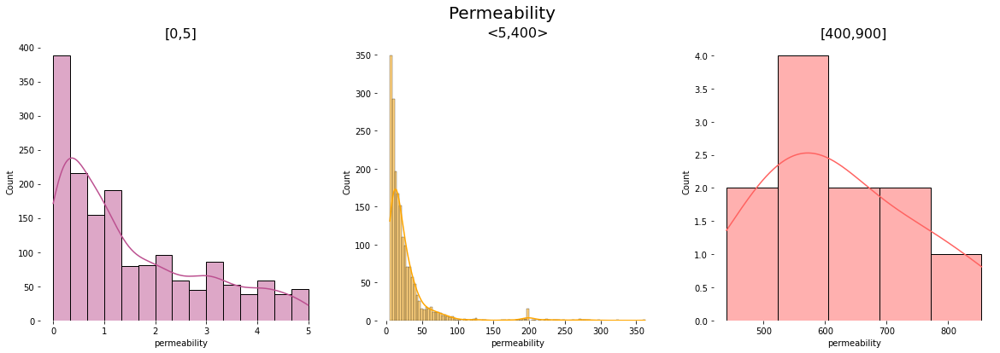

In [84]:
caco_1 = df_caco2[df_caco2['permeability']<=5]
caco_2 = df_caco2[df_caco2['permeability'].between(5, 400, inclusive=False)]
caco_3 = df_caco2[df_caco2['permeability'].between(400,900, inclusive=True)]

fig, axes = plt.subplots(1, 3, figsize = (20, 6))
fig.suptitle('Permeability', fontsize=20)
left = sns.histplot(data=caco_1, x='permeability', ax = axes[0], kde=True, color=colors_palette[2])
center = sns.histplot(data=caco_2, x='permeability', ax = axes[1], kde=True, color=colors_palette[0])
right = sns.histplot(data=caco_3, x='permeability', ax = axes[2], kde=True, color=colors_palette[1])
axes[0].set_title('[0,5]', fontsize=16)
axes[1].set_title('<5,400>', fontsize=16)
axes[2].set_title('[400,900]', fontsize=16)

sns.despine(left=True, bottom=True)

In [85]:
df_scaled = StandardScaler().fit_transform(df_caco['permeability'][:,np.newaxis]);
low_range = df_scaled[df_scaled[:,0].argsort()][:10]
high_range= df_scaled[df_scaled[:,0].argsort()][-10:]
print('outer range (low) of the distribution:')
print(low_range)
print('\nouter range (high) of the distribution:')
print(high_range)

outer range (low) of the distribution:
[[-0.37957043]
 [-0.37957043]
 [-0.37957043]
 [-0.37957043]
 [-0.37957043]
 [-0.37957043]
 [-0.37957043]
 [-0.37957043]
 [-0.37957043]
 [-0.37957043]]

outer range (high) of the distribution:
[[ 4.39209046]
 [ 5.39749059]
 [ 6.64227169]
 [ 7.98280518]
 [ 9.17971009]
 [ 9.21162755]
 [ 9.32333868]
 [10.24894514]
 [11.39797385]
 [13.24918677]]


/home/ewelina/miniconda3/envs/admet/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  """Entry point for launching an IPython kernel.


In [86]:
df_caco2[df_caco2['permeability']>400]

,permeability,MACCSFP1,MACCSFP2,MACCSFP3,MACCSFP4,MACCSFP5,MACCSFP6,MACCSFP7,MACCSFP8,MACCSFP9,MACCSFP10,MACCSFP11,MACCSFP12,MACCSFP13,MACCSFP14,MACCSFP15,MACCSFP16,MACCSFP17,MACCSFP18,MACCSFP19,MACCSFP20,MACCSFP21,MACCSFP22,MACCSFP23,MACCSFP24,MACCSFP25,MACCSFP26,MACCSFP27,MACCSFP28,MACCSFP29,MACCSFP30,MACCSFP31,MACCSFP32,MACCSFP33,MACCSFP34,MACCSFP35,MACCSFP36,MACCSFP37,MACCSFP38,MACCSFP39,MACCSFP40,MACCSFP41,MACCSFP42,MACCSFP43,MACCSFP44,MACCSFP45,MACCSFP46,MACCSFP47,MACCSFP48,MACCSFP49,MACCSFP50,MACCSFP51,MACCSFP52,MACCSFP53,MACCSFP54,MACCSFP55,MACCSFP56,MACCSFP57,MACCSFP58,MACCSFP59,MACCSFP60,MACCSFP61,MACCSFP62,MACCSFP63,MACCSFP64,MACCSFP65,MACCSFP66,MACCSFP67,MACCSFP68,MACCSFP69,MACCSFP70,MACCSFP71,MACCSFP72,MACCSFP73,MACCSFP74,MACCSFP75,MACCSFP76,MACCSFP77,MACCSFP78,MACCSFP79,MACCSFP80,MACCSFP81,MACCSFP82,MACCSFP83,MACCSFP84,MACCSFP85,MACCSFP86,MACCSFP87,MACCSFP88,MACCSFP89,MACCSFP90,MACCSFP91,MACCSFP92,MACCSFP93,MACCSFP94,MACCSFP95,MACCSFP96,MACCSFP97,MACCSFP98,MACCSFP99,MACCSFP100,MACCSFP101,MACCSFP102,MACCSFP103,MACCSFP104,MACCSFP105,MACCSFP106,MACCSFP107,MACCSFP108,MACCSFP109,MACCSFP110,MACCSFP111,MACCSFP112,MACCSFP113,MACCSFP114,MACCSFP115,MACCSFP116,MACCSFP117,MACCSFP118,MACCSFP119,MACCSFP120,MACCSFP121,MACCSFP122,MACCSFP123,MACCSFP124,MACCSFP125,MACCSFP126,MACCSFP127,MACCSFP128,MACCSFP129,MACCSFP130,MACCSFP131,MACCSFP132,MACCSFP133,MACCSFP134,MACCSFP135,MACCSFP136,MACCSFP137,MACCSFP138,MACCSFP139,MACCSFP140,MACCSFP141,MACCSFP142,MACCSFP143,MACCSFP144,MACCSFP145,MACCSFP146,MACCSFP147,MACCSFP148,MACCSFP149,MACCSFP150,MACCSFP151,MACCSFP152,MACCSFP153,MACCSFP154,MACCSFP155,MACCSFP156,MACCSFP157,MACCSFP158,MACCSFP159,MACCSFP160,MACCSFP161,MACCSFP162,MACCSFP163,MACCSFP164,MACCSFP165,MACCSFP166
58,440.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,1,0,1,0,1,0,0,0,0,1,0,0,1,1,1,1,0,0,0,0,1,0,1,0,1,0,0,1,0,0,0,0,0,0,1,0,1,1,1,1,0,0,1,0,1,0,0,0,0,0,0,1,1,1,1,0,0,0,0,1,1,1,1,0,0,1,0,0,0,1,0,1,0,1,0,1,1,0,1,1,1,1,1,0
325,524.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,1,0,0,1,0,1,0,0,0,0,0,0,1,0,0,1,1,1,1,1,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,1,1,1,0,1,1,0,0,0,0,1,0,1,0,0,0,0,0,1,1,1,0,0,0,0,1,1,1,1,0,1,1,0,0,0,1,0,1,0,1,0,1,1,0,1,1,1,1,1,0
344,854.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,1,0,0,1,0,1,0,0,0,0,0,0,1,0,0,1,1,1,1,1,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,1,1,1,0,1,1,0,0,0,0,1,0,1,0,0,0,0,0,1,1,1,0,0,0,0,1,1,1,1,0,1,1,0,0,0,1,0,1,0,1,0,1,1,0,1,1,1,1,1,0
547,608.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,1,0,1,0,1,0,0,0,0,0,0,0,1,1,1,1,0,1,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,1,0,1,0,0,0,0,0,0,1,1,0,1,0,0,0,0,1,1,1,1,0,0,1,0,0,0,1,1,1,0,1,0,1,0,0,1,1,1,1,1,0
801,599.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,1,0,1,1,0,0,0,0,0,1,0,0,1,1,1,1,0,1,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,1,1,1,1,1,1,0,0,1,0,1,1,1,0,0,0,0,0,1,1,1,1,0,0,0,1,1,1,1,1,1,1,0,0,0,1,1,1,0,1,0,1,1,0,1,1,1,1,1,0
864,666.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,1,0,1,0,1,0,0,0,0,1,0,0,1,1,1,1,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,1,0,1,0,1,1,0,0,1,0,1,0,0,0,0,0,0,1,1,1,1,0,0,0,0,1,1,1,1,0,0,1,0,0,0,1,0,1,0,1,0,1,1,0,1,1,1,1,1,0
1031,601.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,1,0,1,0,0,0,0,0,0,1,0,0,1,1,1,1,0,0,0,0,0,

In [87]:
# drop outliers
to_drop_caco.extend(df_caco2[df_caco2['permeability']>400].index)
print(len(to_drop_caco))
df_caco2 = df_caco2[df_caco2['permeability']<=400]
df_caco2

126


,permeability,MACCSFP1,MACCSFP2,MACCSFP3,MACCSFP4,MACCSFP5,MACCSFP6,MACCSFP7,MACCSFP8,MACCSFP9,MACCSFP10,MACCSFP11,MACCSFP12,MACCSFP13,MACCSFP14,MACCSFP15,MACCSFP16,MACCSFP17,MACCSFP18,MACCSFP19,MACCSFP20,MACCSFP21,MACCSFP22,MACCSFP23,MACCSFP24,MACCSFP25,MACCSFP26,MACCSFP27,MACCSFP28,MACCSFP29,MACCSFP30,MACCSFP31,MACCSFP32,MACCSFP33,MACCSFP34,MACCSFP35,MACCSFP36,MACCSFP37,MACCSFP38,MACCSFP39,MACCSFP40,MACCSFP41,MACCSFP42,MACCSFP43,MACCSFP44,MACCSFP45,MACCSFP46,MACCSFP47,MACCSFP48,MACCSFP49,MACCSFP50,MACCSFP51,MACCSFP52,MACCSFP53,MACCSFP54,MACCSFP55,MACCSFP56,MACCSFP57,MACCSFP58,MACCSFP59,MACCSFP60,MACCSFP61,MACCSFP62,MACCSFP63,MACCSFP64,MACCSFP65,MACCSFP66,MACCSFP67,MACCSFP68,MACCSFP69,MACCSFP70,MACCSFP71,MACCSFP72,MACCSFP73,MACCSFP74,MACCSFP75,MACCSFP76,MACCSFP77,MACCSFP78,MACCSFP79,MACCSFP80,MACCSFP81,MACCSFP82,MACCSFP83,MACCSFP84,MACCSFP85,MACCSFP86,MACCSFP87,MACCSFP88,MACCSFP89,MACCSFP90,MACCSFP91,MACCSFP92,MACCSFP93,MACCSFP94,MACCSFP95,MACCSFP96,MACCSFP97,MACCSFP98,MACCSFP99,MACCSFP100,MACCSFP101,MACCSFP102,MACCSFP103,MACCSFP104,MACCSFP105,MACCSFP106,MACCSFP107,MACCSFP108,MACCSFP109,MACCSFP110,MACCSFP111,MACCSFP112,MACCSFP113,MACCSFP114,MACCSFP115,MACCSFP116,MACCSFP117,MACCSFP118,MACCSFP119,MACCSFP120,MACCSFP121,MACCSFP122,MACCSFP123,MACCSFP124,MACCSFP125,MACCSFP126,MACCSFP127,MACCSFP128,MACCSFP129,MACCSFP130,MACCSFP131,MACCSFP132,MACCSFP133,MACCSFP134,MACCSFP135,MACCSFP136,MACCSFP137,MACCSFP138,MACCSFP139,MACCSFP140,MACCSFP141,MACCSFP142,MACCSFP143,MACCSFP144,MACCSFP145,MACCSFP146,MACCSFP147,MACCSFP148,MACCSFP149,MACCSFP150,MACCSFP151,MACCSFP152,MACCSFP153,MACCSFP154,MACCSFP155,MACCSFP156,MACCSFP157,MACCSFP158,MACCSFP159,MACCSFP160,MACCSFP161,MACCSFP162,MACCSFP163,MACCSFP164,MACCSFP165,MACCSFP166
0,4.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,1,1,0,0,0,1,1,1,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,1,1,0,0,0,0,0,1,1,0,1,1,1,0,0,1,0,0,1,1,0,0,0,0,0,0,1,1,1,0,0,0,1,0,1,1,0,1,1,1,1,1,0,1,1,1,1,0,1,1,1,1,1,1,1,1,0
1,200.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,1,1,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,1,1,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,1,1,1,0,1,0,0,0,0,1,0,0,1,0,1,0,0,0,1,0,0,0,0,1,0,1,0,0,1,1,1,0,1,0
2,2.10,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,1,0,0,0,0,0,1,0,0,1,0,1,0,1,1,0,1,0,1,1,0,1,0,0,0,1,1,1,0,1,0,0,1,0,1,0,0,0,1,1,1,1,1,0,1,1,1,1,1,0,0,1,1,0,1,1,1,1,0,1,1,1,0,0,0,1,0,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0
3,2.60,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,1,1,0,0,1,1,0,1,0,0,0,0,0,1,0,1,0,1,0,1,1,1,1,1,0,1,1,0,1,0,1,1,0,1,1,1,1,0,1,0,1,0,1,0,1,1,1,0,0,1,1,1,1,0,1,0,1,1,1,0,1,1,1,1,1,1,1,0,1,1,1,0,0,1,0,1,1,1,1,0,1,0,1,0,1,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,0
4,0.50,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,1,1,0,0,1,1,1,1,0,0,0,0,0,1,1,1,0,1,0,1,1,1,1,1,0,1,1,0,1,0,1,1,1,1,1,1,1,0,1,0,1,0,1,0,1,1,1,0,0,0,1,1,1,0,0,1,1,1,1,0,1,1,1,0,1,1,0,0,1,1,1,0,1,1,0,1,1,1,1,0,0,1,1,0,1,1,1,1,1,1,1,1,0,1,1,1,1,0,1,1,1,1,1,1,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...

In [88]:
df_caco2['permeability'].describe()

count    3515.000000
mean       15.506479
std        30.028085
min         0.000000
25%         1.100000
50%         6.300000
75%        18.350000
max       362.000000
Name: permeability, dtype: float64

### 2.1.4 Classes statistics 📈

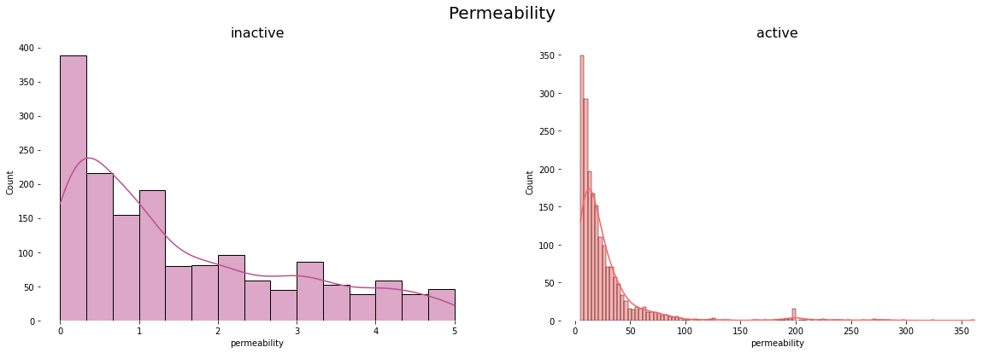

In [89]:
caco_1 = df_caco2[df_caco2['permeability']<=5]
caco_2 = df_caco2[df_caco2['permeability']>5]

fig, axes = plt.subplots(1, 2, figsize = (20, 6))
fig.suptitle('Permeability', fontsize=20)
left = sns.histplot(data=caco_1, x='permeability', ax = axes[0], kde=True, color=colors_palette[2])
right = sns.histplot(data=caco_2, x='permeability', ax = axes[1], kde=True, color=colors_palette[1])
axes[0].set_title('inactive', fontsize=16)
axes[1].set_title('active', fontsize=16)

sns.despine(left=True, bottom=True)

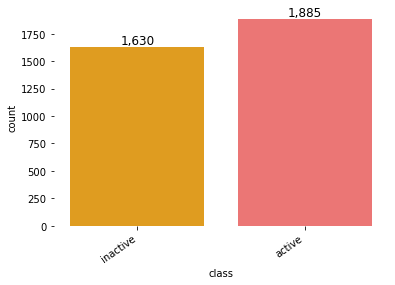

In [90]:
activity_th = []
for i in df_caco2.permeability:
    if float(i) <=5:
        activity_th.append("inactive")
    elif float(i) >5:
        activity_th.append("active")
        
activity_class = pd.Series(activity_th, name='class')
class_df = pd.concat([df_caco2, activity_class], axis=1)

a = sns.countplot(x='class', data=class_df, palette=colors_palette)

annotate(a)

a.set_xticklabels(a.get_xticklabels(), rotation=35, ha="right")
sns.despine(left=True, bottom=True);

Text(0, 0.5, 'Permeability value')

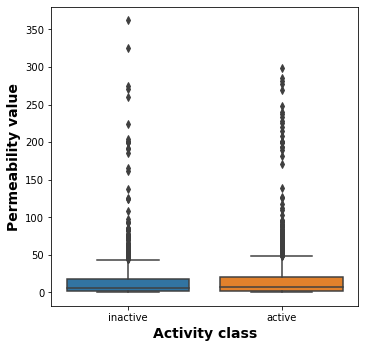

In [92]:
plt.figure(figsize=(5.5, 5.5))

sns.boxplot(x = 'class', y = 'permeability', data = class_df)

plt.xlabel('Activity class', fontsize=14, fontweight='bold')
plt.ylabel('Permeability value', fontsize=14, fontweight='bold')

### 2.1.5 Prepare other fingerprints

In [93]:
to_drop_caco.sort(reverse=True)

In [94]:
df_caco_pubch_all.apply(pd.to_numeric, errors='coerce')
df_caco_pubch_all.drop(to_drop_caco, axis=0, inplace=True)
df_caco_pubch_all

,permeability,PubchemFP0,PubchemFP1,PubchemFP2,PubchemFP3,PubchemFP4,PubchemFP5,PubchemFP6,PubchemFP7,PubchemFP8,PubchemFP9,PubchemFP10,PubchemFP11,PubchemFP12,PubchemFP13,PubchemFP14,PubchemFP15,PubchemFP16,PubchemFP17,PubchemFP18,PubchemFP19,PubchemFP20,PubchemFP21,PubchemFP22,PubchemFP23,PubchemFP24,PubchemFP25,PubchemFP26,PubchemFP27,PubchemFP28,PubchemFP29,PubchemFP30,PubchemFP31,PubchemFP32,PubchemFP33,PubchemFP34,PubchemFP35,PubchemFP36,PubchemFP37,PubchemFP38,PubchemFP39,PubchemFP40,PubchemFP41,PubchemFP42,PubchemFP43,PubchemFP44,PubchemFP45,PubchemFP46,PubchemFP47,PubchemFP48,PubchemFP49,PubchemFP50,PubchemFP51,PubchemFP52,PubchemFP53,PubchemFP54,PubchemFP55,PubchemFP56,PubchemFP57,PubchemFP58,PubchemFP59,PubchemFP60,PubchemFP61,PubchemFP62,PubchemFP63,PubchemFP64,PubchemFP65,PubchemFP66,PubchemFP67,PubchemFP68,PubchemFP69,PubchemFP70,PubchemFP71,PubchemFP72,PubchemFP73,PubchemFP74,PubchemFP75,PubchemFP76,PubchemFP77,PubchemFP78,PubchemFP79,PubchemFP80,PubchemFP81,PubchemFP82,PubchemFP83,PubchemFP84,PubchemFP85,PubchemFP86,PubchemFP87,PubchemFP88,PubchemFP89,PubchemFP90,PubchemFP91,PubchemFP92,PubchemFP93,PubchemFP94,PubchemFP95,PubchemFP96,PubchemFP97,PubchemFP98,PubchemFP99,PubchemFP100,PubchemFP101,PubchemFP102,PubchemFP103,PubchemFP104,PubchemFP105,PubchemFP106,PubchemFP107,PubchemFP108,PubchemFP109,PubchemFP110,PubchemFP111,PubchemFP112,PubchemFP113,PubchemFP114,PubchemFP115,PubchemFP116,PubchemFP117,PubchemFP118,PubchemFP119,PubchemFP120,PubchemFP121,PubchemFP122,PubchemFP123,PubchemFP124,PubchemFP125,PubchemFP126,PubchemFP127,PubchemFP128,PubchemFP129,PubchemFP130,PubchemFP131,PubchemFP132,PubchemFP133,PubchemFP134,PubchemFP135,PubchemFP136,PubchemFP137,PubchemFP138,PubchemFP139,PubchemFP140,PubchemFP141,PubchemFP142,PubchemFP143,PubchemFP144,PubchemFP145,PubchemFP146,PubchemFP147,PubchemFP148,PubchemFP149,PubchemFP150,PubchemFP151,PubchemFP152,PubchemFP153,PubchemFP154,PubchemFP155,PubchemFP156,PubchemFP157,PubchemFP158,PubchemFP159,PubchemFP160,PubchemFP161,PubchemFP162,PubchemFP163,PubchemFP164,PubchemFP165,PubchemFP166,PubchemFP167,PubchemFP168,PubchemFP169,PubchemFP170,PubchemFP171,PubchemFP172,PubchemFP173,PubchemFP174,PubchemFP175,PubchemFP176,PubchemFP177,PubchemFP178,PubchemFP179,PubchemFP180,PubchemFP181,PubchemFP182,PubchemFP183,PubchemFP184,PubchemFP185,PubchemFP186,PubchemFP187,PubchemFP188,PubchemFP189,PubchemFP190,PubchemFP191,PubchemFP192,PubchemFP193,PubchemFP194,PubchemFP195,PubchemFP196,PubchemFP197,PubchemFP198,PubchemFP199,PubchemFP200,PubchemFP201,PubchemFP202,PubchemFP203,PubchemFP204,PubchemFP205,PubchemFP206,PubchemFP207,PubchemFP208,PubchemFP209,PubchemFP210,PubchemFP211,PubchemFP212,PubchemFP213,PubchemFP214,PubchemFP215,PubchemFP216,PubchemFP217,PubchemFP218,PubchemFP219,PubchemFP220,PubchemFP221,PubchemFP222,PubchemFP223,PubchemFP224,PubchemFP225,PubchemFP226,PubchemFP227,PubchemFP228,PubchemFP229,PubchemFP230,PubchemFP231,PubchemFP232,PubchemFP233,PubchemFP234,PubchemFP235,PubchemFP236,PubchemFP237,PubchemFP238,PubchemFP239,PubchemFP240,PubchemFP241,PubchemFP242,PubchemFP243,PubchemFP244,PubchemFP245,PubchemFP246,PubchemFP247,PubchemFP248,PubchemFP249,PubchemFP250,PubchemFP251,PubchemFP252,PubchemFP253,PubchemFP254,PubchemFP255,PubchemFP256,PubchemFP257,PubchemFP258,PubchemFP259,PubchemFP260,PubchemFP261,PubchemFP262,PubchemFP263,PubchemFP264,PubchemFP265,PubchemFP266,PubchemFP267,PubchemFP268,PubchemFP269,PubchemFP270,PubchemFP271,PubchemFP272,PubchemFP273,PubchemFP274,PubchemFP275,PubchemFP276,PubchemFP277,PubchemFP278,PubchemFP279,PubchemFP280,PubchemFP281,PubchemFP282,PubchemFP283,PubchemFP284,PubchemFP285,PubchemFP286,PubchemFP287,PubchemFP288,PubchemFP289,PubchemFP290,PubchemFP291,PubchemFP292,PubchemFP293,PubchemFP294,PubchemFP295,PubchemFP296,PubchemFP297,PubchemFP298,PubchemFP299,PubchemFP300,PubchemFP301,PubchemFP302,PubchemFP303,PubchemFP304,PubchemFP305,PubchemFP306,PubchemFP307,PubchemFP308,PubchemFP309,PubchemFP310,PubchemFP311,PubchemFP312,PubchemFP313,PubchemFP314,P

In [95]:
df_caco_klek_all.apply(pd.to_numeric, errors='coerce')
df_caco_klek_all.drop(to_drop_caco, axis=0, inplace=True)
df_caco_klek_all

permeability  KRFP1  KRFP2  KRFP3  KRFP4  KRFP5  KRFP6  KRFP7  KRFP8  \
0             4.00      1      1      0      0      0      0      0      0   
1           200.00      1      0      0      0      0      0      0      0   
2             2.10      0      0      0      0      0      0      0      0   
3             2.60      1      0      0      0      0      0      0      0   
4             0.50      1      0      0      0      0      0      0      0   
...            ...    ...    ...    ...    ...    ...    ...    ...    ...   
3636          0.13      1      1      0      0      0      0      0      0   
3637          0.11      1      1      0      0      0      0      0      0   
3638          0.53      1      1      0      0      0      0      0      0   
3639          0.07      1      1      0      0      0      0      0      0   
3640          0.01      1      1      0      0      0      0      0      0   

      KRFP9  KRFP10  KRFP11  KRFP12  KRFP13  KRFP14  KRFP15  KRFP16  KRFP17  \
0         0       0       0       0       0       0       0       1       0   
1         0       0       0       0       0       0       0       0       0   
2         0       0       0       0       0       0       0       0       0   
3         0       0       0       0       0       0       0       0       0   
4         0       0       0       0       0       0       0       0       0   
...     ...     ...     ...     ...     ...     ...     ...     ...     ...   
3636      0       0       0       0       0       0       0       1       0   
3637      0       0       0       0       0       0       0       1       0   
3638      0       0       0       0       0       0       0       1       0   
3639      0       0       0       0       0       0       0       1       0   
3640      0       0       0       0       0       0       0       1       0   

      KRFP18  KRFP19  KRFP20  KRFP21  KRFP22  KRFP23  KRFP24  KRFP25  KRFP26  \
0          0       0       1       0       0       0       0       0       0   
1          0       0       0       0       0       0       0       0       0   
2          0       0       0       0       0       0       0       0       0   
3          0       0       0       0       0       0       0       0       0   
4          0       0       0       0       0       0       0       0       0   
...      ...     ...     ...     ...     ...     ...     ...     ...     ...   
3636       0       0       1       0       0       0       0       0       0   
3637       0       0       1       0       0       0       0       0       0   
3638       0       0       1       0       0       0       0       0       0   
3639       0       0       1       0       0       0       0       0       0   
3640       0       0       1       0       0       0       0       0       0   

      KRFP27  KRFP28  KRFP29  KRFP30  KRFP31  KRFP32  KRFP33  KRFP34  KRFP35  \
0          0       0       0       0       0       0       1       0       0   
1          0       0       0       0       0       0       0       0       0   
2          0       0       0       0       0       0       0       0       0   
3          0       0       0       0       0       0       0       0       0   
4          0       0       0       0       0       0       0       0       0   
...      ...     ...     ...     ...     ...     ...     ...     ...     ...   
3636       0       0       0       0       0       0       0       0       0   
3637       0       0       0       0       0       0       0       0       0   
3638       0       0       0       0       0       0       0       0       0   
3639       0       0       0       0       0       0       0       0       0   
3640       0       0       0       0       0       0       0       0       0   

      KRFP36  KRFP37  KRFP38  KRFP39  KRFP40  KRFP41  KRFP42  KRFP43  KRFP44  \
0          0       0       0       0       0       0       0       0       0   
1          0       0       0       0  

### 2.1.6 Save

In [96]:
df_caco2.to_csv('data/processed/caco_maccs_all.csv', index=False)
df_caco_pubch_all.to_csv('data/processed/caco_pubchem_all.csv', index=False)
df_caco_klek_all.to_csv('data/processed/caco_klek_all.csv', index=False)

## 2.2 SDF 

Prepare SDF file with mols. 

### 2.2.1 Load data

In [97]:
suppl = Chem.SDMolSupplier('data/raw/caco2_permeability_from_Chembl_permeability.sdf')
ms = [x for x in suppl if x is not None]
suppl2 = Chem.SDMolSupplier('data/raw/caco2_permeability_from_Chembl_papp.sdf')
ms2 = [x for x in suppl2 if x is not None]
ms +=ms2
len(ms)

3641

### 2.2.2 Preprocess

In [98]:
len(to_drop_caco)

126

In [99]:
for i in to_drop_caco:
    ms.pop(i)

In [100]:
len(ms)

3515

Convert mols to smiles.

In [101]:
caco_smiles = [MolToSmiles(x,isomericSmiles=False) for x in ms ]
df_caco_smiles = pd.DataFrame(caco_smiles, columns=['smiles'])
df_caco_smiles

,smiles
0,Cc1cccc(C)c1C(=O)N1CC2CN(CCC(NC(=O)C3CCCC3)c3c...
1,Nc1ncnc2c1sc1nc(C3CC3)cc(C(F)(F)F)c12
2,CCc1nc(N)nc(N)c1-c1ccc2c(c1)N(CCNC(=O)OC)C(=O)...
3,CCOC(=O)N1CCC(CN(C2Cc3cc(C#N)ccc3N(Cc3cncn3C)C...
4,Cn1cncc1CN1CC(N(CC2CCN(C(=O)CC(C)(C)C)CC2)S(=O...
...,...
3510,Cc1oc(-c2ccccc2Cl)nc1C(=O)NC1CN(S(=O)(=O)c2ccc...
3511,CN(C(=O)C1CN(S(=O)(=O)c2ccccc2)CC1NC(=O)c1cc(-...
3512,O=C(NC1CN(S(=O)(=O)c2ccccc2)CC1C(=O)N1CC2CCNCC...
3513,O=C(NC1CN(S(=O)(=O)c2ccccc2)CC1C(=O)NC1CCCNC1)...


In [102]:
df_caco_smiles = df_caco_smiles.join(df_caco2['permeability'])
df_caco_smiles

,smiles,permeability
0,Cc1cccc(C)c1C(=O)N1CC2CN(CCC(NC(=O)C3CCCC3)c3c...,4.00
1,Nc1ncnc2c1sc1nc(C3CC3)cc(C(F)(F)F)c12,200.00
2,CCc1nc(N)nc(N)c1-c1ccc2c(c1)N(CCNC(=O)OC)C(=O)...,2.10
3,CCOC(=O)N1CCC(CN(C2Cc3cc(C#N)ccc3N(Cc3cncn3C)C...,2.60
4,Cn1cncc1CN1CC(N(CC2CCN(C(=O)CC(C)(C)C)CC2)S(=O...,0.50
...,...,...
3510,Cc1oc(-c2ccccc2Cl)nc1C(=O)NC1CN(S(=O)(=O)c2ccc...,0.15
3511,CN(C(=O)C1CN(S(=O)(=O)c2ccccc2)CC1NC(=O)c1cc(-...,32.00
3512,O=C(NC1CN(S(=O)(=O)c2ccccc2)CC1C(=O)N1CC2CCNCC...,28.00
3513,O=C(NC1CN(S(=O)(=O)c2ccccc2)CC1C(=O)NC1CCCNC1)...,0.36


### 2.2.3 Save

In [103]:
df_caco_smiles.to_csv('data/processed/caco_smiles_all.csv', index=False)

# 3. Protein plasma binding

## 3.1 Data Analyse and Preprocessing 📊

In [110]:
df_protein = pd.read_csv("data/raw/protein_plasma_binding_MACCSFP.csv")
print("Examples: {0}, columns: {1}".format(df_protein.shape[0],df_protein.shape[1]))
df_protein.head()

Examples: 2882, columns: 167


,protein_plasma_binding,MACCSFP1,MACCSFP2,MACCSFP3,MACCSFP4,MACCSFP5,MACCSFP6,MACCSFP7,MACCSFP8,MACCSFP9,MACCSFP10,MACCSFP11,MACCSFP12,MACCSFP13,MACCSFP14,MACCSFP15,MACCSFP16,MACCSFP17,MACCSFP18,MACCSFP19,MACCSFP20,MACCSFP21,MACCSFP22,MACCSFP23,MACCSFP24,MACCSFP25,MACCSFP26,MACCSFP27,MACCSFP28,MACCSFP29,MACCSFP30,MACCSFP31,MACCSFP32,MACCSFP33,MACCSFP34,MACCSFP35,MACCSFP36,MACCSFP37,MACCSFP38,MACCSFP39,MACCSFP40,MACCSFP41,MACCSFP42,MACCSFP43,MACCSFP44,MACCSFP45,MACCSFP46,MACCSFP47,MACCSFP48,MACCSFP49,MACCSFP50,MACCSFP51,MACCSFP52,MACCSFP53,MACCSFP54,MACCSFP55,MACCSFP56,MACCSFP57,MACCSFP58,MACCSFP59,MACCSFP60,MACCSFP61,MACCSFP62,MACCSFP63,MACCSFP64,MACCSFP65,MACCSFP66,MACCSFP67,MACCSFP68,MACCSFP69,MACCSFP70,MACCSFP71,MACCSFP72,MACCSFP73,MACCSFP74,MACCSFP75,MACCSFP76,MACCSFP77,MACCSFP78,MACCSFP79,MACCSFP80,MACCSFP81,MACCSFP82,MACCSFP83,MACCSFP84,MACCSFP85,MACCSFP86,MACCSFP87,MACCSFP88,MACCSFP89,MACCSFP90,MACCSFP91,MACCSFP92,MACCSFP93,MACCSFP94,MACCSFP95,MACCSFP96,MACCSFP97,MACCSFP98,MACCSFP99,MACCSFP100,MACCSFP101,MACCSFP102,MACCSFP103,MACCSFP104,MACCSFP105,MACCSFP106,MACCSFP107,MACCSFP108,MACCSFP109,MACCSFP110,MACCSFP111,MACCSFP112,MACCSFP113,MACCSFP114,MACCSFP115,MACCSFP116,MACCSFP117,MACCSFP118,MACCSFP119,MACCSFP120,MACCSFP121,MACCSFP122,MACCSFP123,MACCSFP124,MACCSFP125,MACCSFP126,MACCSFP127,MACCSFP128,MACCSFP129,MACCSFP130,MACCSFP131,MACCSFP132,MACCSFP133,MACCSFP134,MACCSFP135,MACCSFP136,MACCSFP137,MACCSFP138,MACCSFP139,MACCSFP140,MACCSFP141,MACCSFP142,MACCSFP143,MACCSFP144,MACCSFP145,MACCSFP146,MACCSFP147,MACCSFP148,MACCSFP149,MACCSFP150,MACCSFP151,MACCSFP152,MACCSFP153,MACCSFP154,MACCSFP155,MACCSFP156,MACCSFP157,MACCSFP158,MACCSFP159,MACCSFP160,MACCSFP161,MACCSFP162,MACCSFP163,MACCSFP164,MACCSFP165,MACCSFP166
0,99.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,1,0,0,1,0,1,1,0,0,0,0,0,0,1,0,1,0,0,0,1,1,1,0,1,0,0,0,0,1,0,1,0,1,1,0,1,1,0,0,0,1,0,0,1,1,0,1,0,1,0,0,1,0,0,1,0,1,1,0,0,1,1,1,1,1,1,0,1,1,1,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0
1,89.9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,1,1,0,0,0,0,1,1,0,0,0,0,0,1,0,0,1,1,0,1,1,0,0,0,1,1,1,1,0,0,1,0,0,0,0,0,0,1,0,0,1,0,1,1,0,0,1,0,0,0,0,1,0,0,1,0,1,0,0,0,1,0,0,1,0,1,0,1,0,1,1,1,1,1,1,0
2,97.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,0,1,1,0,1,0,1,1,1,0,0,1,0,0,1,1,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,1,0,1,1,0,1,0,1,1,0,1,1,0,1,0,1,1,1,1,1,1,0
3,100.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,1,1,0,1,0,0,1,1,0,0,1,0,0,0,1,1,0,1,0,0,0,1,1,1,0,1,1,0,1,0,0,0,1,0,0,1,1,1,1,0,0,0,1,0,1,0,0,0,0,1,0,1,0,1,1,1,0,1,1,1,1,0,1,1,0,1,0,1,1,1,1,1,1,1,1,1,0
4,82.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,1,1,0,1,0,1,1,1,1,0,0,0,0,1,0,0,1,1,1,1,1,0,1,1,1,1,1,0,1,1,1,0,0,0,0,1,1,1,0,0,1,0,0,1,1,1,1,0,0,1,1,1,1,1,1,1,1,1,1,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,0


In [111]:
df_protein_pubch = pd.read_csv("data/raw/protein_plasma_binding_PubchemFP.csv")
print("Examples: {0}, columns: {1}".format(df_protein_pubch.shape[0],df_protein_pubch.shape[1]))
df_protein_pubch.head()

Examples: 2882, columns: 882


,protein_plasma_binding,PubchemFP0,PubchemFP1,PubchemFP2,PubchemFP3,PubchemFP4,PubchemFP5,PubchemFP6,PubchemFP7,PubchemFP8,PubchemFP9,PubchemFP10,PubchemFP11,PubchemFP12,PubchemFP13,PubchemFP14,PubchemFP15,PubchemFP16,PubchemFP17,PubchemFP18,PubchemFP19,PubchemFP20,PubchemFP21,PubchemFP22,PubchemFP23,PubchemFP24,PubchemFP25,PubchemFP26,PubchemFP27,PubchemFP28,PubchemFP29,PubchemFP30,PubchemFP31,PubchemFP32,PubchemFP33,PubchemFP34,PubchemFP35,PubchemFP36,PubchemFP37,PubchemFP38,PubchemFP39,PubchemFP40,PubchemFP41,PubchemFP42,PubchemFP43,PubchemFP44,PubchemFP45,PubchemFP46,PubchemFP47,PubchemFP48,PubchemFP49,PubchemFP50,PubchemFP51,PubchemFP52,PubchemFP53,PubchemFP54,PubchemFP55,PubchemFP56,PubchemFP57,PubchemFP58,PubchemFP59,PubchemFP60,PubchemFP61,PubchemFP62,PubchemFP63,PubchemFP64,PubchemFP65,PubchemFP66,PubchemFP67,PubchemFP68,PubchemFP69,PubchemFP70,PubchemFP71,PubchemFP72,PubchemFP73,PubchemFP74,PubchemFP75,PubchemFP76,PubchemFP77,PubchemFP78,PubchemFP79,PubchemFP80,PubchemFP81,PubchemFP82,PubchemFP83,PubchemFP84,PubchemFP85,PubchemFP86,PubchemFP87,PubchemFP88,PubchemFP89,PubchemFP90,PubchemFP91,PubchemFP92,PubchemFP93,PubchemFP94,PubchemFP95,PubchemFP96,PubchemFP97,PubchemFP98,PubchemFP99,PubchemFP100,PubchemFP101,PubchemFP102,PubchemFP103,PubchemFP104,PubchemFP105,PubchemFP106,PubchemFP107,PubchemFP108,PubchemFP109,PubchemFP110,PubchemFP111,PubchemFP112,PubchemFP113,PubchemFP114,PubchemFP115,PubchemFP116,PubchemFP117,PubchemFP118,PubchemFP119,PubchemFP120,PubchemFP121,PubchemFP122,PubchemFP123,PubchemFP124,PubchemFP125,PubchemFP126,PubchemFP127,PubchemFP128,PubchemFP129,PubchemFP130,PubchemFP131,PubchemFP132,PubchemFP133,PubchemFP134,PubchemFP135,PubchemFP136,PubchemFP137,PubchemFP138,PubchemFP139,PubchemFP140,PubchemFP141,PubchemFP142,PubchemFP143,PubchemFP144,PubchemFP145,PubchemFP146,PubchemFP147,PubchemFP148,PubchemFP149,PubchemFP150,PubchemFP151,PubchemFP152,PubchemFP153,PubchemFP154,PubchemFP155,PubchemFP156,PubchemFP157,PubchemFP158,PubchemFP159,PubchemFP160,PubchemFP161,PubchemFP162,PubchemFP163,PubchemFP164,PubchemFP165,PubchemFP166,PubchemFP167,PubchemFP168,PubchemFP169,PubchemFP170,PubchemFP171,PubchemFP172,PubchemFP173,PubchemFP174,PubchemFP175,PubchemFP176,PubchemFP177,PubchemFP178,PubchemFP179,PubchemFP180,PubchemFP181,PubchemFP182,PubchemFP183,PubchemFP184,PubchemFP185,PubchemFP186,PubchemFP187,PubchemFP188,PubchemFP189,PubchemFP190,PubchemFP191,PubchemFP192,PubchemFP193,PubchemFP194,PubchemFP195,PubchemFP196,PubchemFP197,PubchemFP198,PubchemFP199,PubchemFP200,PubchemFP201,PubchemFP202,PubchemFP203,PubchemFP204,PubchemFP205,PubchemFP206,PubchemFP207,PubchemFP208,PubchemFP209,PubchemFP210,PubchemFP211,PubchemFP212,PubchemFP213,PubchemFP214,PubchemFP215,PubchemFP216,PubchemFP217,PubchemFP218,PubchemFP219,PubchemFP220,PubchemFP221,PubchemFP222,PubchemFP223,PubchemFP224,PubchemFP225,PubchemFP226,PubchemFP227,PubchemFP228,PubchemFP229,PubchemFP230,PubchemFP231,PubchemFP232,PubchemFP233,PubchemFP234,PubchemFP235,PubchemFP236,PubchemFP237,PubchemFP238,PubchemFP239,PubchemFP240,PubchemFP241,PubchemFP242,PubchemFP243,PubchemFP244,PubchemFP245,PubchemFP246,PubchemFP247,PubchemFP248,PubchemFP249,PubchemFP250,PubchemFP251,PubchemFP252,PubchemFP253,PubchemFP254,PubchemFP255,PubchemFP256,PubchemFP257,PubchemFP258,PubchemFP259,PubchemFP260,PubchemFP261,PubchemFP262,PubchemFP263,PubchemFP264,PubchemFP265,PubchemFP266,PubchemFP267,PubchemFP268,PubchemFP269,PubchemFP270,PubchemFP271,PubchemFP272,PubchemFP273,PubchemFP274,PubchemFP275,PubchemFP276,PubchemFP277,PubchemFP278,PubchemFP279,PubchemFP280,PubchemFP281,PubchemFP282,PubchemFP283,PubchemFP284,PubchemFP285,PubchemFP286,PubchemFP287,PubchemFP288,PubchemFP289,PubchemFP290,PubchemFP291,PubchemFP292,PubchemFP293,PubchemFP294,PubchemFP295,PubchemFP296,PubchemFP297,PubchemFP298,PubchemFP299,PubchemFP300,PubchemFP301,PubchemFP302,PubchemFP303,PubchemFP304,PubchemFP305,PubchemFP306,PubchemFP307,PubchemFP308,PubchemFP309,PubchemFP310,PubchemFP311,PubchemFP312,PubchemFP313,Pubc

In [112]:
df_protein_klek = pd.read_csv("data/raw/protein_plasma_binding_KlekFP.csv")
print("Examples: {0}, columns: {1}".format(df_protein_klek.shape[0],df_protein_klek.shape[1]))
df_protein_klek.head()

Examples: 2882, columns: 4861


protein_plasma_binding  KRFP1  KRFP2  KRFP3  KRFP4  KRFP5  KRFP6  KRFP7  \
0                    99.0      1      1      0      0      0      0      0   
1                    89.9      1      0      0      0      0      0      0   
2                    97.0      1      0      0      0      0      0      0   
3                   100.0      1      0      0      0      0      0      0   
4                    82.0      1      0      0      0      0      0      0   

   KRFP8  KRFP9  KRFP10  KRFP11  KRFP12  KRFP13  KRFP14  KRFP15  KRFP16  \
0      0      0       0       0       0       0       0       0       0   
1      0      0       0       0       0       0       1       0       1   
2      0      0       0       0       0       0       1       0       0   
3      0      0       0       0       0       0       0       0       0   
4      0      0       0       0       0       0       0       0       0   

   KRFP17  KRFP18  KRFP19  KRFP20  KRFP21  KRFP22  KRFP23  KRFP24  KRFP25  \
0       0       0       0       1       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       1       0       0       0       0       0       0       0   
4       0       0       0       1       0       0       0       0       0   

   KRFP26  KRFP27  KRFP28  KRFP29  KRFP30  KRFP31  KRFP32  KRFP33  KRFP34  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       1       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP35  KRFP36  KRFP37  KRFP38  KRFP39  KRFP40  KRFP41  KRFP42  KRFP43  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP44  KRFP45  KRFP46  KRFP47  KRFP48  KRFP49  KRFP50  KRFP51  KRFP52  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP53  KRFP54  KRFP55  KRFP56  KRFP57  KRFP58  KRFP59  KRFP60  KRFP61  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP62  KRFP63  KRFP64  KRFP65  KRFP66  KRFP67  KRFP68  KRFP69  KRFP70  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP71  KRFP72  KRFP73  KRFP74  KRFP75  KRFP76  KRFP77  KRFP78  KRFP79  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0 

### 3.1.1 Missing/Invalid values 🔎

In [113]:
# count missing values
print("Missing values: {0}".format(df_protein.isnull().sum().sum()))
print("Missing values: {0}".format(df_protein_pubch.isnull().sum().sum()))
print("Missing values: {0}".format(df_protein_klek.isnull().sum().sum()))

Missing values: 219
Missing values: 219
Missing values: 219


In [118]:
to_drop_protein = [index for index, row in df_protein.iterrows() if row.isnull().any()]
print(len(to_drop_protein))
df_protein.drop(to_drop_protein, axis=0, inplace=True)
print("Examples: {0}, columns: {1}".format(df_protein.shape[0],df_protein.shape[1]))
df_protein.head()

219
Examples: 2663, columns: 167


,protein_plasma_binding,MACCSFP1,MACCSFP2,MACCSFP3,MACCSFP4,MACCSFP5,MACCSFP6,MACCSFP7,MACCSFP8,MACCSFP9,MACCSFP10,MACCSFP11,MACCSFP12,MACCSFP13,MACCSFP14,MACCSFP15,MACCSFP16,MACCSFP17,MACCSFP18,MACCSFP19,MACCSFP20,MACCSFP21,MACCSFP22,MACCSFP23,MACCSFP24,MACCSFP25,MACCSFP26,MACCSFP27,MACCSFP28,MACCSFP29,MACCSFP30,MACCSFP31,MACCSFP32,MACCSFP33,MACCSFP34,MACCSFP35,MACCSFP36,MACCSFP37,MACCSFP38,MACCSFP39,MACCSFP40,MACCSFP41,MACCSFP42,MACCSFP43,MACCSFP44,MACCSFP45,MACCSFP46,MACCSFP47,MACCSFP48,MACCSFP49,MACCSFP50,MACCSFP51,MACCSFP52,MACCSFP53,MACCSFP54,MACCSFP55,MACCSFP56,MACCSFP57,MACCSFP58,MACCSFP59,MACCSFP60,MACCSFP61,MACCSFP62,MACCSFP63,MACCSFP64,MACCSFP65,MACCSFP66,MACCSFP67,MACCSFP68,MACCSFP69,MACCSFP70,MACCSFP71,MACCSFP72,MACCSFP73,MACCSFP74,MACCSFP75,MACCSFP76,MACCSFP77,MACCSFP78,MACCSFP79,MACCSFP80,MACCSFP81,MACCSFP82,MACCSFP83,MACCSFP84,MACCSFP85,MACCSFP86,MACCSFP87,MACCSFP88,MACCSFP89,MACCSFP90,MACCSFP91,MACCSFP92,MACCSFP93,MACCSFP94,MACCSFP95,MACCSFP96,MACCSFP97,MACCSFP98,MACCSFP99,MACCSFP100,MACCSFP101,MACCSFP102,MACCSFP103,MACCSFP104,MACCSFP105,MACCSFP106,MACCSFP107,MACCSFP108,MACCSFP109,MACCSFP110,MACCSFP111,MACCSFP112,MACCSFP113,MACCSFP114,MACCSFP115,MACCSFP116,MACCSFP117,MACCSFP118,MACCSFP119,MACCSFP120,MACCSFP121,MACCSFP122,MACCSFP123,MACCSFP124,MACCSFP125,MACCSFP126,MACCSFP127,MACCSFP128,MACCSFP129,MACCSFP130,MACCSFP131,MACCSFP132,MACCSFP133,MACCSFP134,MACCSFP135,MACCSFP136,MACCSFP137,MACCSFP138,MACCSFP139,MACCSFP140,MACCSFP141,MACCSFP142,MACCSFP143,MACCSFP144,MACCSFP145,MACCSFP146,MACCSFP147,MACCSFP148,MACCSFP149,MACCSFP150,MACCSFP151,MACCSFP152,MACCSFP153,MACCSFP154,MACCSFP155,MACCSFP156,MACCSFP157,MACCSFP158,MACCSFP159,MACCSFP160,MACCSFP161,MACCSFP162,MACCSFP163,MACCSFP164,MACCSFP165,MACCSFP166
0,99.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,1,0,0,1,0,1,1,0,0,0,0,0,0,1,0,1,0,0,0,1,1,1,0,1,0,0,0,0,1,0,1,0,1,1,0,1,1,0,0,0,1,0,0,1,1,0,1,0,1,0,0,1,0,0,1,0,1,1,0,0,1,1,1,1,1,1,0,1,1,1,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0
1,89.9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,1,1,0,0,0,0,1,1,0,0,0,0,0,1,0,0,1,1,0,1,1,0,0,0,1,1,1,1,0,0,1,0,0,0,0,0,0,1,0,0,1,0,1,1,0,0,1,0,0,0,0,1,0,0,1,0,1,0,0,0,1,0,0,1,0,1,0,1,0,1,1,1,1,1,1,0
2,97.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,0,1,1,0,1,0,1,1,1,0,0,1,0,0,1,1,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,1,0,1,1,0,1,0,1,1,0,1,1,0,1,0,1,1,1,1,1,1,0
3,100.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,1,1,0,1,0,0,1,1,0,0,1,0,0,0,1,1,0,1,0,0,0,1,1,1,0,1,1,0,1,0,0,0,1,0,0,1,1,1,1,0,0,0,1,0,1,0,0,0,0,1,0,1,0,1,1,1,0,1,1,1,1,0,1,1,0,1,0,1,1,1,1,1,1,1,1,1,0
4,82.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,1,1,0,1,0,1,1,1,1,0,0,0,0,1,0,0,1,1,1,1,1,0,1,1,1,1,1,0,1,1,1,0,0,0,0,1,1,1,0,0,1,0,0,1,1,1,1,0,0,1,1,1,1,1,1,1,1,1,1,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,0


In [120]:
# Convert non-numeric entries to NaN (everything that cannot be converted to a numeric value)
df_protein2 = (df_protein.drop(df_protein.columns, axis=1)
         .join(df_protein[df_protein.columns].apply(pd.to_numeric, errors='coerce')))

In [121]:
print("Invalid values: {0}".format(df_protein2.isnull().sum().sum()))

Invalid values: 0


### 3.1.2 Class balance/Outliers

In [122]:
df_protein2['protein_plasma_binding'].describe()

count    2663.000000
mean       86.185137
std        22.506276
min         0.030000
25%        85.000000
50%        96.000000
75%        99.000000
max       100.000000
Name: protein_plasma_binding, dtype: float64

In [129]:
inactive = df_protein2[df_protein2['protein_plasma_binding']<=95].count()[0]
active = df_protein2[df_protein2['protein_plasma_binding']>95].count()[0]
all_protein = df_protein2['protein_plasma_binding'].count()
print('For 50: {0} Active compounds and {1} inactive compounds'.format(active, inactive))
print('For 50: {:.2%} Active compounds and {:.2%} inactive compounds'.format(active/all_protein, inactive/all_protein))

For 50: 1435 Active compounds and 1228 inactive compounds
For 50: 53.89% Active compounds and 46.11% inactive compounds


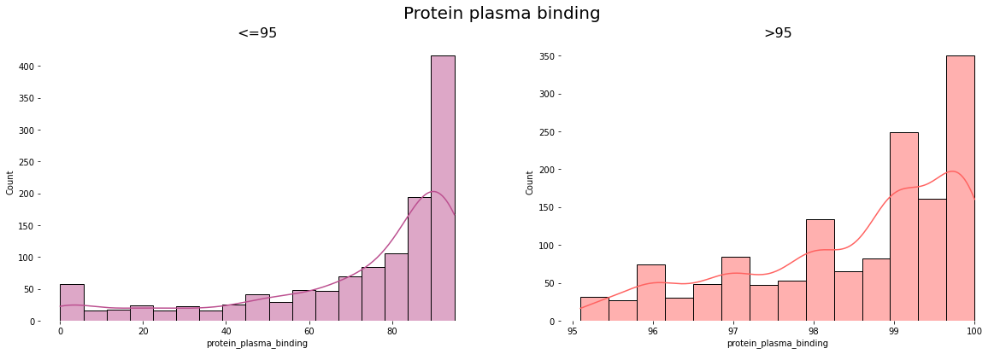

In [132]:
protein_1 = df_protein2[df_protein2['protein_plasma_binding']<=95]
protein_2 = df_protein2[df_protein2['protein_plasma_binding']>95]

fig, axes = plt.subplots(1, 2, figsize = (20, 6))
fig.suptitle('Protein plasma binding', fontsize=20)
left = sns.histplot(data=protein_1, x='protein_plasma_binding', ax = axes[0], kde=True, color=colors_palette[2])
right = sns.histplot(data=protein_2, x='protein_plasma_binding', ax = axes[1], kde=True, color=colors_palette[1])
axes[0].set_title('<=95', fontsize=16)
axes[1].set_title('>95', fontsize=16)

sns.despine(left=True, bottom=True)

In [134]:
df_scaled = StandardScaler().fit_transform(df_protein2['protein_plasma_binding'][:,np.newaxis]);
low_range = df_scaled[df_scaled[:,0].argsort()][:10]
high_range= df_scaled[df_scaled[:,0].argsort()][-10:]
print('outer range (low) of the distribution:')
print(low_range)
print('\nouter range (high) of the distribution:')
print(high_range)

outer range (low) of the distribution:
[[-3.8287684 ]
 [-3.8287684 ]
 [-3.8287684 ]
 [-3.828324  ]
 [-3.828324  ]
 [-3.82743519]
 [-3.82654638]
 [-3.82610198]
 [-3.82565757]
 [-3.82565757]]

outer range (high) of the distribution:
[[0.61393798]
 [0.61393798]
 [0.61393798]
 [0.61393798]
 [0.61393798]
 [0.61393798]
 [0.61393798]
 [0.61393798]
 [0.61393798]
 [0.61393798]]


/home/ewelina/miniconda3/envs/admet/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  """Entry point for launching an IPython kernel.


### 3.1.3 Classes statistics 📈

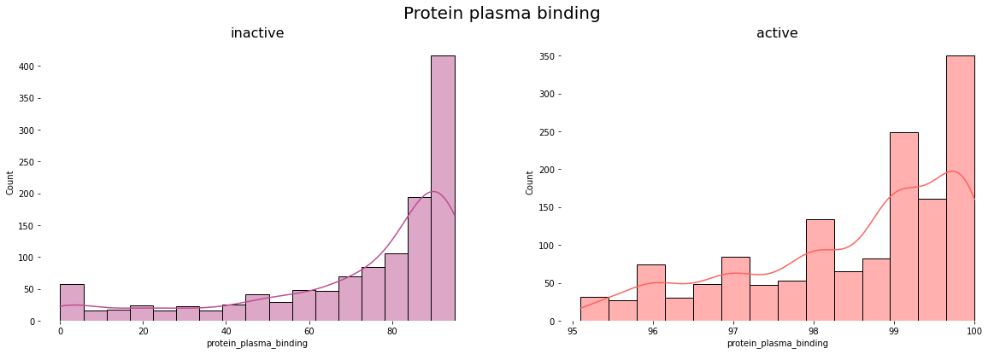

In [135]:
protein_1 = df_protein2[df_protein2['protein_plasma_binding']<=95]
protein_2 = df_protein2[df_protein2['protein_plasma_binding']>95]

fig, axes = plt.subplots(1, 2, figsize = (20, 6))
fig.suptitle('Protein plasma binding', fontsize=20)
left = sns.histplot(data=protein_1, x='protein_plasma_binding', ax = axes[0], kde=True, color=colors_palette[2])
right = sns.histplot(data=protein_2, x='protein_plasma_binding', ax = axes[1], kde=True, color=colors_palette[1])
axes[0].set_title('inactive', fontsize=16)
axes[1].set_title('active', fontsize=16)

sns.despine(left=True, bottom=True)

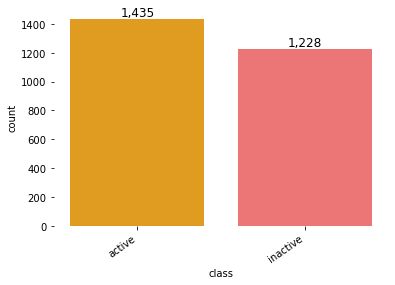

In [137]:
activity_th = []
for i in df_protein2.protein_plasma_binding:
    if float(i) <= 95:
        activity_th.append("inactive")
    elif float(i) > 95:
        activity_th.append("active")
    
activity_class = pd.Series(activity_th, name='class')
class_df = pd.concat([df_protein2, activity_class], axis=1)

a = sns.countplot(x='class', data=class_df, palette=colors_palette)

annotate(a)

a.set_xticklabels(a.get_xticklabels(), rotation=35, ha="right")
sns.despine(left=True, bottom=True);

Text(0, 0.5, 'Protein plasma binding value')

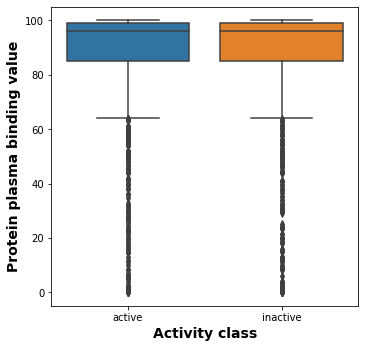

In [139]:
plt.figure(figsize=(5.5, 5.5))

sns.boxplot(x = 'class', y = 'protein_plasma_binding', data = class_df)

plt.xlabel('Activity class', fontsize=14, fontweight='bold')
plt.ylabel('Protein plasma binding value', fontsize=14, fontweight='bold')

### 3.1.4 Prepare other fingerprints

In [140]:
to_drop_protein.sort(reverse=True)

In [141]:
df_protein_pubch.apply(pd.to_numeric, errors='coerce')
df_protein_pubch.drop(to_drop_protein, axis=0, inplace=True)
df_protein_pubch

,protein_plasma_binding,PubchemFP0,PubchemFP1,PubchemFP2,PubchemFP3,PubchemFP4,PubchemFP5,PubchemFP6,PubchemFP7,PubchemFP8,PubchemFP9,PubchemFP10,PubchemFP11,PubchemFP12,PubchemFP13,PubchemFP14,PubchemFP15,PubchemFP16,PubchemFP17,PubchemFP18,PubchemFP19,PubchemFP20,PubchemFP21,PubchemFP22,PubchemFP23,PubchemFP24,PubchemFP25,PubchemFP26,PubchemFP27,PubchemFP28,PubchemFP29,PubchemFP30,PubchemFP31,PubchemFP32,PubchemFP33,PubchemFP34,PubchemFP35,PubchemFP36,PubchemFP37,PubchemFP38,PubchemFP39,PubchemFP40,PubchemFP41,PubchemFP42,PubchemFP43,PubchemFP44,PubchemFP45,PubchemFP46,PubchemFP47,PubchemFP48,PubchemFP49,PubchemFP50,PubchemFP51,PubchemFP52,PubchemFP53,PubchemFP54,PubchemFP55,PubchemFP56,PubchemFP57,PubchemFP58,PubchemFP59,PubchemFP60,PubchemFP61,PubchemFP62,PubchemFP63,PubchemFP64,PubchemFP65,PubchemFP66,PubchemFP67,PubchemFP68,PubchemFP69,PubchemFP70,PubchemFP71,PubchemFP72,PubchemFP73,PubchemFP74,PubchemFP75,PubchemFP76,PubchemFP77,PubchemFP78,PubchemFP79,PubchemFP80,PubchemFP81,PubchemFP82,PubchemFP83,PubchemFP84,PubchemFP85,PubchemFP86,PubchemFP87,PubchemFP88,PubchemFP89,PubchemFP90,PubchemFP91,PubchemFP92,PubchemFP93,PubchemFP94,PubchemFP95,PubchemFP96,PubchemFP97,PubchemFP98,PubchemFP99,PubchemFP100,PubchemFP101,PubchemFP102,PubchemFP103,PubchemFP104,PubchemFP105,PubchemFP106,PubchemFP107,PubchemFP108,PubchemFP109,PubchemFP110,PubchemFP111,PubchemFP112,PubchemFP113,PubchemFP114,PubchemFP115,PubchemFP116,PubchemFP117,PubchemFP118,PubchemFP119,PubchemFP120,PubchemFP121,PubchemFP122,PubchemFP123,PubchemFP124,PubchemFP125,PubchemFP126,PubchemFP127,PubchemFP128,PubchemFP129,PubchemFP130,PubchemFP131,PubchemFP132,PubchemFP133,PubchemFP134,PubchemFP135,PubchemFP136,PubchemFP137,PubchemFP138,PubchemFP139,PubchemFP140,PubchemFP141,PubchemFP142,PubchemFP143,PubchemFP144,PubchemFP145,PubchemFP146,PubchemFP147,PubchemFP148,PubchemFP149,PubchemFP150,PubchemFP151,PubchemFP152,PubchemFP153,PubchemFP154,PubchemFP155,PubchemFP156,PubchemFP157,PubchemFP158,PubchemFP159,PubchemFP160,PubchemFP161,PubchemFP162,PubchemFP163,PubchemFP164,PubchemFP165,PubchemFP166,PubchemFP167,PubchemFP168,PubchemFP169,PubchemFP170,PubchemFP171,PubchemFP172,PubchemFP173,PubchemFP174,PubchemFP175,PubchemFP176,PubchemFP177,PubchemFP178,PubchemFP179,PubchemFP180,PubchemFP181,PubchemFP182,PubchemFP183,PubchemFP184,PubchemFP185,PubchemFP186,PubchemFP187,PubchemFP188,PubchemFP189,PubchemFP190,PubchemFP191,PubchemFP192,PubchemFP193,PubchemFP194,PubchemFP195,PubchemFP196,PubchemFP197,PubchemFP198,PubchemFP199,PubchemFP200,PubchemFP201,PubchemFP202,PubchemFP203,PubchemFP204,PubchemFP205,PubchemFP206,PubchemFP207,PubchemFP208,PubchemFP209,PubchemFP210,PubchemFP211,PubchemFP212,PubchemFP213,PubchemFP214,PubchemFP215,PubchemFP216,PubchemFP217,PubchemFP218,PubchemFP219,PubchemFP220,PubchemFP221,PubchemFP222,PubchemFP223,PubchemFP224,PubchemFP225,PubchemFP226,PubchemFP227,PubchemFP228,PubchemFP229,PubchemFP230,PubchemFP231,PubchemFP232,PubchemFP233,PubchemFP234,PubchemFP235,PubchemFP236,PubchemFP237,PubchemFP238,PubchemFP239,PubchemFP240,PubchemFP241,PubchemFP242,PubchemFP243,PubchemFP244,PubchemFP245,PubchemFP246,PubchemFP247,PubchemFP248,PubchemFP249,PubchemFP250,PubchemFP251,PubchemFP252,PubchemFP253,PubchemFP254,PubchemFP255,PubchemFP256,PubchemFP257,PubchemFP258,PubchemFP259,PubchemFP260,PubchemFP261,PubchemFP262,PubchemFP263,PubchemFP264,PubchemFP265,PubchemFP266,PubchemFP267,PubchemFP268,PubchemFP269,PubchemFP270,PubchemFP271,PubchemFP272,PubchemFP273,PubchemFP274,PubchemFP275,PubchemFP276,PubchemFP277,PubchemFP278,PubchemFP279,PubchemFP280,PubchemFP281,PubchemFP282,PubchemFP283,PubchemFP284,PubchemFP285,PubchemFP286,PubchemFP287,PubchemFP288,PubchemFP289,PubchemFP290,PubchemFP291,PubchemFP292,PubchemFP293,PubchemFP294,PubchemFP295,PubchemFP296,PubchemFP297,PubchemFP298,PubchemFP299,PubchemFP300,PubchemFP301,PubchemFP302,PubchemFP303,PubchemFP304,PubchemFP305,PubchemFP306,PubchemFP307,PubchemFP308,PubchemFP309,PubchemFP310,PubchemFP311,PubchemFP312,PubchemFP313,Pubc

In [142]:
df_protein_klek.apply(pd.to_numeric, errors='coerce')
df_protein_klek.drop(to_drop_protein, axis=0, inplace=True)
df_protein_klek

protein_plasma_binding  KRFP1  KRFP2  KRFP3  KRFP4  KRFP5  KRFP6  KRFP7  \
0                       99.0      1      1      0      0      0      0      0   
1                       89.9      1      0      0      0      0      0      0   
2                       97.0      1      0      0      0      0      0      0   
3                      100.0      1      0      0      0      0      0      0   
4                       82.0      1      0      0      0      0      0      0   
...                      ...    ...    ...    ...    ...    ...    ...    ...   
2877                    98.3      1      0      0      0      0      0      0   
2878                    96.0      1      1      0      0      0      0      0   
2879                    99.9      0      0      0      0      0      0      0   
2880                    87.0      1      0      0      0      0      0      0   
2881                    75.0      1      0      0      0      0      0      0   

      KRFP8  KRFP9  KRFP10  KRFP11  KRFP12  KRFP13  KRFP14  KRFP15  KRFP16  \
0         0      0       0       0       0       0       0       0       0   
1         0      0       0       0       0       0       1       0       1   
2         0      0       0       0       0       0       1       0       0   
3         0      0       0       0       0       0       0       0       0   
4         0      0       0       0       0       0       0       0       0   
...     ...    ...     ...     ...     ...     ...     ...     ...     ...   
2877      0      0       0       0       0       0       1       0       0   
2878      0      0       0       0       0       0       1       0       0   
2879      0      0       0       0       0       0       0       0       0   
2880      0      0       0       0       0       0       0       0       0   
2881      0      0       0       0       0       0       0       0       0   

      KRFP17  KRFP18  KRFP19  KRFP20  KRFP21  KRFP22  KRFP23  KRFP24  KRFP25  \
0          0       0       0       1       0       0       0       0       0   
1          0       0       0       0       0       0       0       0       0   
2          0       0       0       0       0       0       0       0       0   
3          0       1       0       0       0       0       0       0       0   
4          0       0       0       1       0       0       0       0       0   
...      ...     ...     ...     ...     ...     ...     ...     ...     ...   
2877       0       0       0       0       0       0       0       0       0   
2878       0       0       0       1       0       0       0       0       0   
2879       0       0       0       0       0       0       0       0       0   
2880       0       0       0       0       0       0       0       0       0   
2881       0       0       0       0       0       0       0       0       0   

      KRFP26  KRFP27  KRFP28  KRFP29  KRFP30  KRFP31  KRFP32  KRFP33  KRFP34  \
0          0       0       0       0       0       0       0       0       0   
1          0       0       0       0       0       0       0       0       0   
2          0       0       0       0       0       0       0       0       0   
3          0       0       0       0       0       0       0       1       0   
4          0       0       0       0       0       0       0       0       0   
...      ...     ...     ...     ...     ...     ...     ...     ...     ...   
2877       0       0       0       0       0       0       0       0       0   
2878       0       0       0       0       0       0       0       0       0   
2879       0       0       0       0       0       0       0       0       0   
2880       0       0       0       0       0       0       0       0       0   
2881       0       0       0       0       0       0       0       0       0   

      KRFP35  KRFP36  KRFP37  KRFP38  KRFP39  KRFP40  KRFP41  KRFP42  KRFP43  \
0          0       0       0       0       0       0       0       0       0   
1          0  

### 3.1.5 Save

In [143]:
df_protein2.to_csv('data/processed/protein_maccs_all.csv', index=False)
df_protein_pubch.to_csv('data/processed/protein_pubchem_all.csv', index=False)
df_protein_klek.to_csv('data/processed/protein_klek_all.csv', index=False)

## 3.2 SDF 

Prepare SDF file with mols. 

### 3.2.1 Load data

In [144]:
suppl = Chem.SDMolSupplier('data/raw/protein_plasma_binding_for_fingeprint_calculation.sdf')
ms = [x for x in suppl if x is not None]
len(ms)

2882

### 3.2.2 Preprocess

In [145]:
len(to_drop_protein)

219

In [146]:
for i in to_drop_protein:
    ms.pop(i)

In [147]:
len(ms)

2663

Convert mols to smiles.

In [148]:
protein_smiles = [MolToSmiles(x,isomericSmiles=False) for x in ms ]
df_protein_smiles = pd.DataFrame(protein_smiles, columns=['smiles'])
df_protein_smiles

,smiles
0,Cc1ccc(CNC(=O)c2cc(C#CC(C)(C)O)cnc2NCc2ccc3c(c...
1,Cc1cccc(NC(=O)c2cc(F)cc(C#N)c2)n1
2,CC1CCCN1CCc1cc2cc(-c3ccc(C#N)cc3)ccc2o1
3,COc1cc2ccc(Br)cc2cc1C(c1ccccc1)C(O)(CCN(C)C)c1...
4,CCC(C)(CCN1CCOCC1)N(Cc1cc2ccccc2n(C)c1=O)C(=O)...
...,...
2658,Cc1ccc(-c2cc(C(F)(F)F)ccc2C2CCOc3cc(S(=O)(=O)N...
2659,CC(C)c1c(-c2cnn(C3COC3)c2)[nH]c2c(C#N)cnn2c1=O
2660,O=C(O)c1cccc(-n2c(C=Cc3cc(Cl)cs3)nc3ccccc3c2=O)c1
2661,CN1CCN(c2ncc(-c3ccc4c(Nc5cnccn5)ccnc4c3)cn2)CC1


In [149]:
df_protein_smiles = df_protein_smiles.join(df_protein2['protein_plasma_binding'])
df_protein_smiles

,smiles,protein_plasma_binding
0,Cc1ccc(CNC(=O)c2cc(C#CC(C)(C)O)cnc2NCc2ccc3c(c...,99.0
1,Cc1cccc(NC(=O)c2cc(F)cc(C#N)c2)n1,89.9
2,CC1CCCN1CCc1cc2cc(-c3ccc(C#N)cc3)ccc2o1,97.0
3,COc1cc2ccc(Br)cc2cc1C(c1ccccc1)C(O)(CCN(C)C)c1...,100.0
4,CCC(C)(CCN1CCOCC1)N(Cc1cc2ccccc2n(C)c1=O)C(=O)...,82.0
...,...,...
2658,Cc1ccc(-c2cc(C(F)(F)F)ccc2C2CCOc3cc(S(=O)(=O)N...,90.0
2659,CC(C)c1c(-c2cnn(C3COC3)c2)[nH]c2c(C#N)cnn2c1=O,24.8
2660,O=C(O)c1cccc(-n2c(C=Cc3cc(Cl)cs3)nc3ccccc3c2=O)c1,95.4
2661,CN1CCN(c2ncc(-c3ccc4c(Nc5cnccn5)ccnc4c3)cn2)CC1,85.0


### 3.2.3 Save

In [151]:
df_protein_smiles.to_csv('data/processed/protein_smiles_all.csv', index=False)

# 4. Solubility

## 4.1 Data Analyse and Preprocessing 📊

In [3]:
df_solub = pd.read_csv("data/raw/solubility_MACCSFP.csv")
print("Examples: {0}, columns: {1}".format(df_solub.shape[0],df_solub.shape[1]))
df_solub.head()

Examples: 1763, columns: 167


,Solubility,MACCSFP1,MACCSFP2,MACCSFP3,MACCSFP4,MACCSFP5,MACCSFP6,MACCSFP7,MACCSFP8,MACCSFP9,MACCSFP10,MACCSFP11,MACCSFP12,MACCSFP13,MACCSFP14,MACCSFP15,MACCSFP16,MACCSFP17,MACCSFP18,MACCSFP19,MACCSFP20,MACCSFP21,MACCSFP22,MACCSFP23,MACCSFP24,MACCSFP25,MACCSFP26,MACCSFP27,MACCSFP28,MACCSFP29,MACCSFP30,MACCSFP31,MACCSFP32,MACCSFP33,MACCSFP34,MACCSFP35,MACCSFP36,MACCSFP37,MACCSFP38,MACCSFP39,MACCSFP40,MACCSFP41,MACCSFP42,MACCSFP43,MACCSFP44,MACCSFP45,MACCSFP46,MACCSFP47,MACCSFP48,MACCSFP49,MACCSFP50,MACCSFP51,MACCSFP52,MACCSFP53,MACCSFP54,MACCSFP55,MACCSFP56,MACCSFP57,MACCSFP58,MACCSFP59,MACCSFP60,MACCSFP61,MACCSFP62,MACCSFP63,MACCSFP64,MACCSFP65,MACCSFP66,MACCSFP67,MACCSFP68,MACCSFP69,MACCSFP70,MACCSFP71,MACCSFP72,MACCSFP73,MACCSFP74,MACCSFP75,MACCSFP76,MACCSFP77,MACCSFP78,MACCSFP79,MACCSFP80,MACCSFP81,MACCSFP82,MACCSFP83,MACCSFP84,MACCSFP85,MACCSFP86,MACCSFP87,MACCSFP88,MACCSFP89,MACCSFP90,MACCSFP91,MACCSFP92,MACCSFP93,MACCSFP94,MACCSFP95,MACCSFP96,MACCSFP97,MACCSFP98,MACCSFP99,MACCSFP100,MACCSFP101,MACCSFP102,MACCSFP103,MACCSFP104,MACCSFP105,MACCSFP106,MACCSFP107,MACCSFP108,MACCSFP109,MACCSFP110,MACCSFP111,MACCSFP112,MACCSFP113,MACCSFP114,MACCSFP115,MACCSFP116,MACCSFP117,MACCSFP118,MACCSFP119,MACCSFP120,MACCSFP121,MACCSFP122,MACCSFP123,MACCSFP124,MACCSFP125,MACCSFP126,MACCSFP127,MACCSFP128,MACCSFP129,MACCSFP130,MACCSFP131,MACCSFP132,MACCSFP133,MACCSFP134,MACCSFP135,MACCSFP136,MACCSFP137,MACCSFP138,MACCSFP139,MACCSFP140,MACCSFP141,MACCSFP142,MACCSFP143,MACCSFP144,MACCSFP145,MACCSFP146,MACCSFP147,MACCSFP148,MACCSFP149,MACCSFP150,MACCSFP151,MACCSFP152,MACCSFP153,MACCSFP154,MACCSFP155,MACCSFP156,MACCSFP157,MACCSFP158,MACCSFP159,MACCSFP160,MACCSFP161,MACCSFP162,MACCSFP163,MACCSFP164,MACCSFP165,MACCSFP166
0,500.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1,1,0,0,0,0,1,1,0,0,1,0,0,1,0,1,0,0,0,1,0,0,0,0,1,1,1,0,1,0,0,0,1,1,0,1,1,1,0,0,1,1,1,1,1,0,1,1,1,0,1,1,1,1,0,1,0,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0
1,900.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,1,0,1,1,1,1,0,1,0,1,1,0,1,1,0,0,0,0,0,0,0,1,1,0,1,1,0,1,1,0,0,0,0,0,1,0,0,1,1,1,0,0,1,0,0,0,0,0,1,0,0,1,1,1,1,0,0,0,0,1,0,1,0,0,0,1,1,0,1,0,0,1,1,1,0,1,1,1,1,1,1,1,1,0
2,1100.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,1,0,0,1,1,1,0,0,1,0,0,1,0,1,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,1,1,0,0,1,0,1,0,0,0,0,0,0,1,1,1,1,0,0,0,0,0,1,1,1,0,0,1,0,1,0,1,1,1,1,1,0,1,1,0,1,1,1,1,1,0
3,1400.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,1,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,1,1,1,0,0,0,1,0,1,1,1,0,1,0,1,0,0,1,1,1,1,1,0,0,1,1,1,1,0,0,0,1,1,1,1,1,1,1,1,1,1,0
4,1500.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,1,1,1,0,0,1,0,1,0,0,0,0,0,1,0,1,0,1,0,0,1,0,0,1,0,1,1,0,1,0,0,0,0,1,0,1,1,1,1,0,1,0,1,0,0,1,0,0,0,0,0,1,1,0,0,1,0,0,1,0,1,1,1,0,1,1,0,0,1,1,1,0,1,1,0,1,1,1,1,0,0,0,1,0,0,1,1,1,1,0,0,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,0


In [4]:
df_solub_pubch = pd.read_csv("data/raw/solubility_PubchemFP.csv")
print("Examples: {0}, columns: {1}".format(df_solub_pubch.shape[0],df_solub_pubch.shape[1]))
df_solub_pubch.head()

Examples: 1763, columns: 882


,Solubility,PubchemFP0,PubchemFP1,PubchemFP2,PubchemFP3,PubchemFP4,PubchemFP5,PubchemFP6,PubchemFP7,PubchemFP8,PubchemFP9,PubchemFP10,PubchemFP11,PubchemFP12,PubchemFP13,PubchemFP14,PubchemFP15,PubchemFP16,PubchemFP17,PubchemFP18,PubchemFP19,PubchemFP20,PubchemFP21,PubchemFP22,PubchemFP23,PubchemFP24,PubchemFP25,PubchemFP26,PubchemFP27,PubchemFP28,PubchemFP29,PubchemFP30,PubchemFP31,PubchemFP32,PubchemFP33,PubchemFP34,PubchemFP35,PubchemFP36,PubchemFP37,PubchemFP38,PubchemFP39,PubchemFP40,PubchemFP41,PubchemFP42,PubchemFP43,PubchemFP44,PubchemFP45,PubchemFP46,PubchemFP47,PubchemFP48,PubchemFP49,PubchemFP50,PubchemFP51,PubchemFP52,PubchemFP53,PubchemFP54,PubchemFP55,PubchemFP56,PubchemFP57,PubchemFP58,PubchemFP59,PubchemFP60,PubchemFP61,PubchemFP62,PubchemFP63,PubchemFP64,PubchemFP65,PubchemFP66,PubchemFP67,PubchemFP68,PubchemFP69,PubchemFP70,PubchemFP71,PubchemFP72,PubchemFP73,PubchemFP74,PubchemFP75,PubchemFP76,PubchemFP77,PubchemFP78,PubchemFP79,PubchemFP80,PubchemFP81,PubchemFP82,PubchemFP83,PubchemFP84,PubchemFP85,PubchemFP86,PubchemFP87,PubchemFP88,PubchemFP89,PubchemFP90,PubchemFP91,PubchemFP92,PubchemFP93,PubchemFP94,PubchemFP95,PubchemFP96,PubchemFP97,PubchemFP98,PubchemFP99,PubchemFP100,PubchemFP101,PubchemFP102,PubchemFP103,PubchemFP104,PubchemFP105,PubchemFP106,PubchemFP107,PubchemFP108,PubchemFP109,PubchemFP110,PubchemFP111,PubchemFP112,PubchemFP113,PubchemFP114,PubchemFP115,PubchemFP116,PubchemFP117,PubchemFP118,PubchemFP119,PubchemFP120,PubchemFP121,PubchemFP122,PubchemFP123,PubchemFP124,PubchemFP125,PubchemFP126,PubchemFP127,PubchemFP128,PubchemFP129,PubchemFP130,PubchemFP131,PubchemFP132,PubchemFP133,PubchemFP134,PubchemFP135,PubchemFP136,PubchemFP137,PubchemFP138,PubchemFP139,PubchemFP140,PubchemFP141,PubchemFP142,PubchemFP143,PubchemFP144,PubchemFP145,PubchemFP146,PubchemFP147,PubchemFP148,PubchemFP149,PubchemFP150,PubchemFP151,PubchemFP152,PubchemFP153,PubchemFP154,PubchemFP155,PubchemFP156,PubchemFP157,PubchemFP158,PubchemFP159,PubchemFP160,PubchemFP161,PubchemFP162,PubchemFP163,PubchemFP164,PubchemFP165,PubchemFP166,PubchemFP167,PubchemFP168,PubchemFP169,PubchemFP170,PubchemFP171,PubchemFP172,PubchemFP173,PubchemFP174,PubchemFP175,PubchemFP176,PubchemFP177,PubchemFP178,PubchemFP179,PubchemFP180,PubchemFP181,PubchemFP182,PubchemFP183,PubchemFP184,PubchemFP185,PubchemFP186,PubchemFP187,PubchemFP188,PubchemFP189,PubchemFP190,PubchemFP191,PubchemFP192,PubchemFP193,PubchemFP194,PubchemFP195,PubchemFP196,PubchemFP197,PubchemFP198,PubchemFP199,PubchemFP200,PubchemFP201,PubchemFP202,PubchemFP203,PubchemFP204,PubchemFP205,PubchemFP206,PubchemFP207,PubchemFP208,PubchemFP209,PubchemFP210,PubchemFP211,PubchemFP212,PubchemFP213,PubchemFP214,PubchemFP215,PubchemFP216,PubchemFP217,PubchemFP218,PubchemFP219,PubchemFP220,PubchemFP221,PubchemFP222,PubchemFP223,PubchemFP224,PubchemFP225,PubchemFP226,PubchemFP227,PubchemFP228,PubchemFP229,PubchemFP230,PubchemFP231,PubchemFP232,PubchemFP233,PubchemFP234,PubchemFP235,PubchemFP236,PubchemFP237,PubchemFP238,PubchemFP239,PubchemFP240,PubchemFP241,PubchemFP242,PubchemFP243,PubchemFP244,PubchemFP245,PubchemFP246,PubchemFP247,PubchemFP248,PubchemFP249,PubchemFP250,PubchemFP251,PubchemFP252,PubchemFP253,PubchemFP254,PubchemFP255,PubchemFP256,PubchemFP257,PubchemFP258,PubchemFP259,PubchemFP260,PubchemFP261,PubchemFP262,PubchemFP263,PubchemFP264,PubchemFP265,PubchemFP266,PubchemFP267,PubchemFP268,PubchemFP269,PubchemFP270,PubchemFP271,PubchemFP272,PubchemFP273,PubchemFP274,PubchemFP275,PubchemFP276,PubchemFP277,PubchemFP278,PubchemFP279,PubchemFP280,PubchemFP281,PubchemFP282,PubchemFP283,PubchemFP284,PubchemFP285,PubchemFP286,PubchemFP287,PubchemFP288,PubchemFP289,PubchemFP290,PubchemFP291,PubchemFP292,PubchemFP293,PubchemFP294,PubchemFP295,PubchemFP296,PubchemFP297,PubchemFP298,PubchemFP299,PubchemFP300,PubchemFP301,PubchemFP302,PubchemFP303,PubchemFP304,PubchemFP305,PubchemFP306,PubchemFP307,PubchemFP308,PubchemFP309,PubchemFP310,PubchemFP311,PubchemFP312,PubchemFP313,PubchemFP314,Pub

In [5]:
df_solub_klek = pd.read_csv("data/raw/solubility_KlekFP.csv")
print("Examples: {0}, columns: {1}".format(df_solub_klek.shape[0],df_solub_klek.shape[1]))
df_solub_klek.head()

Examples: 1763, columns: 4861


Solubility  KRFP1  KRFP2  KRFP3  KRFP4  KRFP5  KRFP6  KRFP7  KRFP8  KRFP9  \
0       500.0      1      0      0      0      0      0      0      0      0   
1       900.0      1      0      0      0      0      0      0      0      0   
2      1100.0      0      0      0      0      0      0      0      0      0   
3      1400.0      0      0      0      0      0      0      0      0      0   
4      1500.0      1      0      0      0      0      0      0      0      0   

   KRFP10  KRFP11  KRFP12  KRFP13  KRFP14  KRFP15  KRFP16  KRFP17  KRFP18  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       1       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP19  KRFP20  KRFP21  KRFP22  KRFP23  KRFP24  KRFP25  KRFP26  KRFP27  \
0       0       0       0       0       0       0       0       0       0   
1       0       1       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP28  KRFP29  KRFP30  KRFP31  KRFP32  KRFP33  KRFP34  KRFP35  KRFP36  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP37  KRFP38  KRFP39  KRFP40  KRFP41  KRFP42  KRFP43  KRFP44  KRFP45  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP46  KRFP47  KRFP48  KRFP49  KRFP50  KRFP51  KRFP52  KRFP53  KRFP54  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP55  KRFP56  KRFP57  KRFP58  KRFP59  KRFP60  KRFP61  KRFP62  KRFP63  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP64  KRFP65  KRFP66  KRFP67  KRFP68  KRFP69  KRFP70  KRFP71  KRFP72  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0       0       0       0   
3       0       0       0       0       0       0       0       0       0   
4       0       0       0       0       0       0       0       0       0   

   KRFP73  KRFP74  KRFP75  KRFP76  KRFP77  KRFP78  KRFP79  KRFP80  KRFP81  \
0       0       0       0       0       0       0       0       0       0   
1       0       0       0       0       0       0       0       0       0   
2       0       0       0       0       0       0 

### 4.1.1 Missing/Invalid values 🔎

In [6]:
# count missing values
print("Missing values: {0}".format(df_solub.isnull().sum().sum()))
print("Missing values: {0}".format(df_solub_pubch.isnull().sum().sum()))
print("Missing values: {0}".format(df_solub_klek.isnull().sum().sum()))

Missing values: 0
Missing values: 0
Missing values: 0


In [7]:
# Convert non-numeric entries to NaN (everything that cannot be converted to a numeric value)
df_solub2 = (df_solub.drop(df_solub.columns, axis=1)
         .join(df_solub[df_solub.columns].apply(pd.to_numeric, errors='coerce')))

In [8]:
print("Invalid values: {0}".format(df_solub2.isnull().sum().sum()))

Invalid values: 0


### 4.1.2 Class balance/Outliers

In [9]:
df_solub2['Solubility'].describe()

count    1.763000e+03
mean     1.877717e+05
std      3.277080e+05
min      1.000000e+02
25%      5.400000e+03
50%      3.630000e+04
75%      1.950000e+05
max      1.513600e+06
Name: Solubility, dtype: float64

In [10]:
inactive = df_solub2[df_solub2['Solubility']<=20000].count()[0]
active = df_solub2[df_solub2['Solubility']>20000].count()[0]
all_solub = df_solub2['Solubility'].count()
print('For 20000: {0} Active compounds and {1} inactive compounds'.format(active, inactive))
print('For 20000: {:.2%} active compounds and {:.2%} inactive compounds'.format(active/all_solub, inactive/all_solub))

For 20000: 1025 Active compounds and 738 inactive compounds
For 20000: 58.14% active compounds and 41.86% inactive compounds


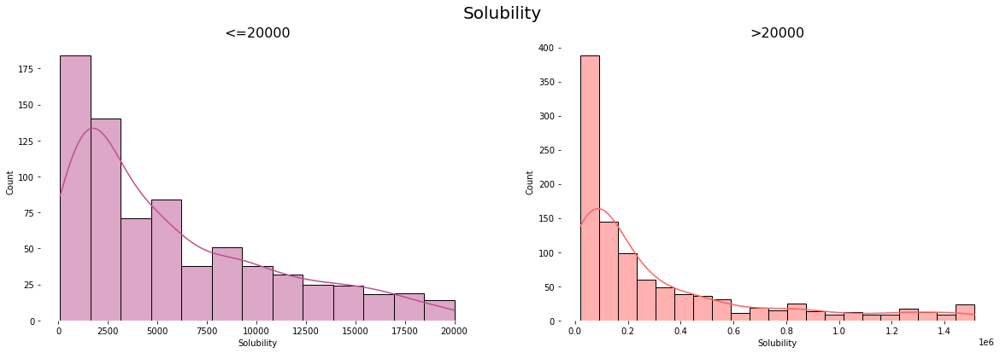

In [11]:
solub_1 = df_solub2[df_solub2['Solubility']<=20000]
solub_2 = df_solub2[df_solub2['Solubility']>20000]

fig, axes = plt.subplots(1, 2, figsize = (20, 6))
fig.suptitle('Solubility', fontsize=20)
left = sns.histplot(data=solub_1, x='Solubility', ax = axes[0], kde=True, color=colors_palette[2])
right = sns.histplot(data=solub_2, x='Solubility', ax = axes[1], kde=True, color=colors_palette[1])
axes[0].set_title('<=20000', fontsize=16)
axes[1].set_title('>20000', fontsize=16)

sns.despine(left=True, bottom=True)

In [12]:
df_scaled = StandardScaler().fit_transform(df_solub['Solubility'][:,np.newaxis]);
low_range = df_scaled[df_scaled[:,0].argsort()][:10]
high_range= df_scaled[df_scaled[:,0].argsort()][-10:]
print('outer range (low) of the distribution:')
print(low_range)
print('\nouter range (high) of the distribution:')
print(high_range)

outer range (low) of the distribution:
[[-0.57284212]
 [-0.57284212]
 [-0.57284212]
 [-0.57284212]
 [-0.57284212]
 [-0.57284212]
 [-0.57253689]
 [-0.57253689]
 [-0.57253689]
 [-0.57253689]]

outer range (high) of the distribution:
[[4.04690914]
 [4.04690914]
 [4.04690914]
 [4.04690914]
 [4.04690914]
 [4.04690914]
 [4.04690914]
 [4.04690914]
 [4.04690914]
 [4.04690914]]


/home/ewelina/miniconda3/envs/admet/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  """Entry point for launching an IPython kernel.


### 4.1.3 Calculate logarithm

1. Convert nM to M.
2. Apply -log10.

solubility -> > >20000 active

logarithm_of solubility ->  < 4.7 active

In [17]:
df_solub2 = df_solub2.assign(Solubility = -np.log10(df_solub2.Solubility*(10**-9)))
df_solub2

,Solubility,MACCSFP1,MACCSFP2,MACCSFP3,MACCSFP4,MACCSFP5,MACCSFP6,MACCSFP7,MACCSFP8,MACCSFP9,MACCSFP10,MACCSFP11,MACCSFP12,MACCSFP13,MACCSFP14,MACCSFP15,MACCSFP16,MACCSFP17,MACCSFP18,MACCSFP19,MACCSFP20,MACCSFP21,MACCSFP22,MACCSFP23,MACCSFP24,MACCSFP25,MACCSFP26,MACCSFP27,MACCSFP28,MACCSFP29,MACCSFP30,MACCSFP31,MACCSFP32,MACCSFP33,MACCSFP34,MACCSFP35,MACCSFP36,MACCSFP37,MACCSFP38,MACCSFP39,MACCSFP40,MACCSFP41,MACCSFP42,MACCSFP43,MACCSFP44,MACCSFP45,MACCSFP46,MACCSFP47,MACCSFP48,MACCSFP49,MACCSFP50,MACCSFP51,MACCSFP52,MACCSFP53,MACCSFP54,MACCSFP55,MACCSFP56,MACCSFP57,MACCSFP58,MACCSFP59,MACCSFP60,MACCSFP61,MACCSFP62,MACCSFP63,MACCSFP64,MACCSFP65,MACCSFP66,MACCSFP67,MACCSFP68,MACCSFP69,MACCSFP70,MACCSFP71,MACCSFP72,MACCSFP73,MACCSFP74,MACCSFP75,MACCSFP76,MACCSFP77,MACCSFP78,MACCSFP79,MACCSFP80,MACCSFP81,MACCSFP82,MACCSFP83,MACCSFP84,MACCSFP85,MACCSFP86,MACCSFP87,MACCSFP88,MACCSFP89,MACCSFP90,MACCSFP91,MACCSFP92,MACCSFP93,MACCSFP94,MACCSFP95,MACCSFP96,MACCSFP97,MACCSFP98,MACCSFP99,MACCSFP100,MACCSFP101,MACCSFP102,MACCSFP103,MACCSFP104,MACCSFP105,MACCSFP106,MACCSFP107,MACCSFP108,MACCSFP109,MACCSFP110,MACCSFP111,MACCSFP112,MACCSFP113,MACCSFP114,MACCSFP115,MACCSFP116,MACCSFP117,MACCSFP118,MACCSFP119,MACCSFP120,MACCSFP121,MACCSFP122,MACCSFP123,MACCSFP124,MACCSFP125,MACCSFP126,MACCSFP127,MACCSFP128,MACCSFP129,MACCSFP130,MACCSFP131,MACCSFP132,MACCSFP133,MACCSFP134,MACCSFP135,MACCSFP136,MACCSFP137,MACCSFP138,MACCSFP139,MACCSFP140,MACCSFP141,MACCSFP142,MACCSFP143,MACCSFP144,MACCSFP145,MACCSFP146,MACCSFP147,MACCSFP148,MACCSFP149,MACCSFP150,MACCSFP151,MACCSFP152,MACCSFP153,MACCSFP154,MACCSFP155,MACCSFP156,MACCSFP157,MACCSFP158,MACCSFP159,MACCSFP160,MACCSFP161,MACCSFP162,MACCSFP163,MACCSFP164,MACCSFP165,MACCSFP166
0,6.301030,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1,1,0,0,0,0,1,1,0,0,1,0,0,1,0,1,0,0,0,1,0,0,0,0,1,1,1,0,1,0,0,0,1,1,0,1,1,1,0,0,1,1,1,1,1,0,1,1,1,0,1,1,1,1,0,1,0,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0
1,6.045757,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,1,0,1,1,1,1,0,1,0,1,1,0,1,1,0,0,0,0,0,0,0,1,1,0,1,1,0,1,1,0,0,0,0,0,1,0,0,1,1,1,0,0,1,0,0,0,0,0,1,0,0,1,1,1,1,0,0,0,0,1,0,1,0,0,0,1,1,0,1,0,0,1,1,1,0,1,1,1,1,1,1,1,1,0
2,5.958607,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,1,0,0,1,1,1,0,0,1,0,0,1,0,1,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,1,1,0,0,1,0,1,0,0,0,0,0,0,1,1,1,1,0,0,0,0,0,1,1,1,0,0,1,0,1,0,1,1,1,1,1,0,1,1,0,1,1,1,1,1,0
3,5.853872,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,1,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,1,1,1,0,0,0,1,0,1,1,1,0,1,0,1,0,0,1,1,1,1,1,0,0,1,1,1,1,0,0,0,1,1,1,1,1,1,1,1,1,1,0
4,5.823909,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,1,1,1,0,0,1,0,1,0,0,0,0,0,1,0,1,0,1,0,0,1,0,0,1,0,1,1,0,1,0,0,0,0,1,0,1,1,1,1,0,1,0,1,0,0,1,0,0,0,0,0,1,1,0,0,1,0,0,1,0,1,1,1,0,1,1,0,0,1,1,1,0,1,1,0,1,1,1,1,0,0,0,1,0,0,1,1,1,1,0,0,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...

In [20]:
-np.log10(20000*(10**-9))

4.698970004336019

In [18]:
df_solub2['Solubility'].describe()

count    1763.000000
mean        4.490631
std         0.966107
min         2.819989
25%         3.709965
50%         4.440093
75%         5.267606
max         7.000000
Name: Solubility, dtype: float64

### 4.1.4 Classes statistics 📈

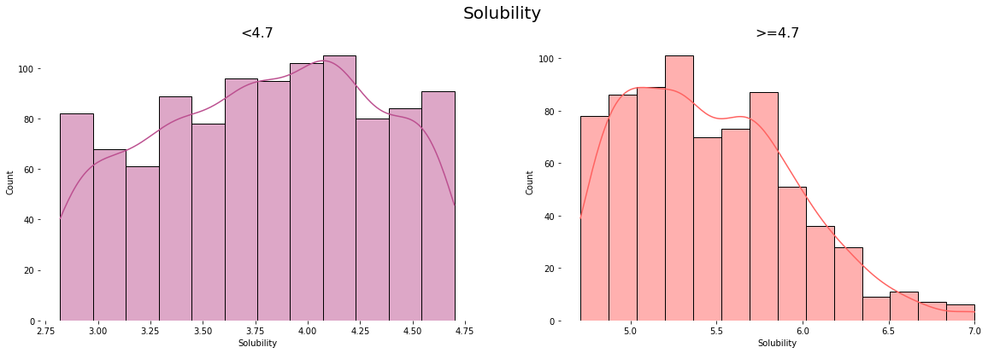

In [23]:
solub_1 = df_solub2[df_solub2['Solubility']<4.7]
solub_2 = df_solub2[df_solub2['Solubility']>=4.7]

fig, axes = plt.subplots(1, 2, figsize = (20, 6))
fig.suptitle('Solubility', fontsize=20)
left = sns.histplot(data=solub_1, x='Solubility', ax = axes[0], kde=True, color=colors_palette[2])
right = sns.histplot(data=solub_2, x='Solubility', ax = axes[1], kde=True, color=colors_palette[1])
axes[0].set_title('<4.7', fontsize=16)
axes[1].set_title('>=4.7', fontsize=16)

sns.despine(left=True, bottom=True)

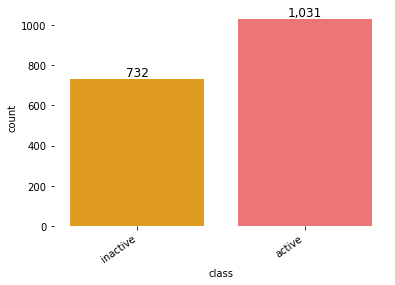

In [24]:
activity_th = []
for i in df_solub2.Solubility:
    if float(i) <4.7:
        activity_th.append("active")
    elif float(i) >=4.7:
        activity_th.append("inactive")
        
activity_class = pd.Series(activity_th, name='class')
class_df = pd.concat([df_solub2, activity_class], axis=1)

a = sns.countplot(x='class', data=class_df, palette=colors_palette)

annotate(a)

a.set_xticklabels(a.get_xticklabels(), rotation=35, ha="right")
sns.despine(left=True, bottom=True);

Text(0, 0.5, 'Solubility value')

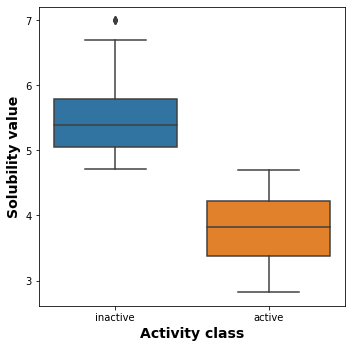

In [25]:
plt.figure(figsize=(5.5, 5.5))

sns.boxplot(x = 'class', y = 'Solubility', data = class_df)

plt.xlabel('Activity class', fontsize=14, fontweight='bold')
plt.ylabel('Solubility value', fontsize=14, fontweight='bold')

### 4.1.4 Prepare other fingerprints

In [27]:
df_solub2.rename({'Solubility': 'solubility'}, axis=1, inplace=True)
df_solub_pubch.rename({'Solubility': 'solubility'}, axis=1, inplace=True)
df_solub_klek.rename({'Solubility': 'solubility'}, axis=1, inplace=True)

In [28]:
df_solub_pubch.apply(pd.to_numeric, errors='coerce')
df_solub_pubch = df_solub_pubch.assign(solubility = -np.log10(df_solub_pubch.solubility*(10**-9)))
df_solub_pubch

,solubility,PubchemFP0,PubchemFP1,PubchemFP2,PubchemFP3,PubchemFP4,PubchemFP5,PubchemFP6,PubchemFP7,PubchemFP8,PubchemFP9,PubchemFP10,PubchemFP11,PubchemFP12,PubchemFP13,PubchemFP14,PubchemFP15,PubchemFP16,PubchemFP17,PubchemFP18,PubchemFP19,PubchemFP20,PubchemFP21,PubchemFP22,PubchemFP23,PubchemFP24,PubchemFP25,PubchemFP26,PubchemFP27,PubchemFP28,PubchemFP29,PubchemFP30,PubchemFP31,PubchemFP32,PubchemFP33,PubchemFP34,PubchemFP35,PubchemFP36,PubchemFP37,PubchemFP38,PubchemFP39,PubchemFP40,PubchemFP41,PubchemFP42,PubchemFP43,PubchemFP44,PubchemFP45,PubchemFP46,PubchemFP47,PubchemFP48,PubchemFP49,PubchemFP50,PubchemFP51,PubchemFP52,PubchemFP53,PubchemFP54,PubchemFP55,PubchemFP56,PubchemFP57,PubchemFP58,PubchemFP59,PubchemFP60,PubchemFP61,PubchemFP62,PubchemFP63,PubchemFP64,PubchemFP65,PubchemFP66,PubchemFP67,PubchemFP68,PubchemFP69,PubchemFP70,PubchemFP71,PubchemFP72,PubchemFP73,PubchemFP74,PubchemFP75,PubchemFP76,PubchemFP77,PubchemFP78,PubchemFP79,PubchemFP80,PubchemFP81,PubchemFP82,PubchemFP83,PubchemFP84,PubchemFP85,PubchemFP86,PubchemFP87,PubchemFP88,PubchemFP89,PubchemFP90,PubchemFP91,PubchemFP92,PubchemFP93,PubchemFP94,PubchemFP95,PubchemFP96,PubchemFP97,PubchemFP98,PubchemFP99,PubchemFP100,PubchemFP101,PubchemFP102,PubchemFP103,PubchemFP104,PubchemFP105,PubchemFP106,PubchemFP107,PubchemFP108,PubchemFP109,PubchemFP110,PubchemFP111,PubchemFP112,PubchemFP113,PubchemFP114,PubchemFP115,PubchemFP116,PubchemFP117,PubchemFP118,PubchemFP119,PubchemFP120,PubchemFP121,PubchemFP122,PubchemFP123,PubchemFP124,PubchemFP125,PubchemFP126,PubchemFP127,PubchemFP128,PubchemFP129,PubchemFP130,PubchemFP131,PubchemFP132,PubchemFP133,PubchemFP134,PubchemFP135,PubchemFP136,PubchemFP137,PubchemFP138,PubchemFP139,PubchemFP140,PubchemFP141,PubchemFP142,PubchemFP143,PubchemFP144,PubchemFP145,PubchemFP146,PubchemFP147,PubchemFP148,PubchemFP149,PubchemFP150,PubchemFP151,PubchemFP152,PubchemFP153,PubchemFP154,PubchemFP155,PubchemFP156,PubchemFP157,PubchemFP158,PubchemFP159,PubchemFP160,PubchemFP161,PubchemFP162,PubchemFP163,PubchemFP164,PubchemFP165,PubchemFP166,PubchemFP167,PubchemFP168,PubchemFP169,PubchemFP170,PubchemFP171,PubchemFP172,PubchemFP173,PubchemFP174,PubchemFP175,PubchemFP176,PubchemFP177,PubchemFP178,PubchemFP179,PubchemFP180,PubchemFP181,PubchemFP182,PubchemFP183,PubchemFP184,PubchemFP185,PubchemFP186,PubchemFP187,PubchemFP188,PubchemFP189,PubchemFP190,PubchemFP191,PubchemFP192,PubchemFP193,PubchemFP194,PubchemFP195,PubchemFP196,PubchemFP197,PubchemFP198,PubchemFP199,PubchemFP200,PubchemFP201,PubchemFP202,PubchemFP203,PubchemFP204,PubchemFP205,PubchemFP206,PubchemFP207,PubchemFP208,PubchemFP209,PubchemFP210,PubchemFP211,PubchemFP212,PubchemFP213,PubchemFP214,PubchemFP215,PubchemFP216,PubchemFP217,PubchemFP218,PubchemFP219,PubchemFP220,PubchemFP221,PubchemFP222,PubchemFP223,PubchemFP224,PubchemFP225,PubchemFP226,PubchemFP227,PubchemFP228,PubchemFP229,PubchemFP230,PubchemFP231,PubchemFP232,PubchemFP233,PubchemFP234,PubchemFP235,PubchemFP236,PubchemFP237,PubchemFP238,PubchemFP239,PubchemFP240,PubchemFP241,PubchemFP242,PubchemFP243,PubchemFP244,PubchemFP245,PubchemFP246,PubchemFP247,PubchemFP248,PubchemFP249,PubchemFP250,PubchemFP251,PubchemFP252,PubchemFP253,PubchemFP254,PubchemFP255,PubchemFP256,PubchemFP257,PubchemFP258,PubchemFP259,PubchemFP260,PubchemFP261,PubchemFP262,PubchemFP263,PubchemFP264,PubchemFP265,PubchemFP266,PubchemFP267,PubchemFP268,PubchemFP269,PubchemFP270,PubchemFP271,PubchemFP272,PubchemFP273,PubchemFP274,PubchemFP275,PubchemFP276,PubchemFP277,PubchemFP278,PubchemFP279,PubchemFP280,PubchemFP281,PubchemFP282,PubchemFP283,PubchemFP284,PubchemFP285,PubchemFP286,PubchemFP287,PubchemFP288,PubchemFP289,PubchemFP290,PubchemFP291,PubchemFP292,PubchemFP293,PubchemFP294,PubchemFP295,PubchemFP296,PubchemFP297,PubchemFP298,PubchemFP299,PubchemFP300,PubchemFP301,PubchemFP302,PubchemFP303,PubchemFP304,PubchemFP305,PubchemFP306,PubchemFP307,PubchemFP308,PubchemFP309,PubchemFP310,PubchemFP311,PubchemFP312,PubchemFP313,PubchemFP314,Pub

In [29]:
df_solub_klek.apply(pd.to_numeric, errors='coerce')
df_solub_klek = df_solub_klek.assign(solubility = -np.log10(df_solub_klek.solubility*(10**-9)))
df_solub_klek

solubility  KRFP1  KRFP2  KRFP3  KRFP4  KRFP5  KRFP6  KRFP7  KRFP8  \
0       6.301030      1      0      0      0      0      0      0      0   
1       6.045757      1      0      0      0      0      0      0      0   
2       5.958607      0      0      0      0      0      0      0      0   
3       5.853872      0      0      0      0      0      0      0      0   
4       5.823909      1      0      0      0      0      0      0      0   
...          ...    ...    ...    ...    ...    ...    ...    ...    ...   
1758    4.829738      0      0      0      0      0      0      0      0   
1759    4.669586      1      0      0      0      0      0      0      0   
1760    5.958607      1      0      0      0      0      0      0      0   
1761    5.886057      0      0      0      0      0      0      0      0   
1762    5.886057      1      1      0      0      0      0      0      0   

      KRFP9  KRFP10  KRFP11  KRFP12  KRFP13  KRFP14  KRFP15  KRFP16  KRFP17  \
0         0       0       0       0       0       0       0       0       0   
1         0       0       0       0       0       0       0       1       0   
2         0       0       0       0       0       0       0       0       0   
3         0       0       0       0       0       0       0       0       0   
4         0       0       0       0       0       0       0       0       0   
...     ...     ...     ...     ...     ...     ...     ...     ...     ...   
1758      0       0       0       0       0       0       0       0       0   
1759      0       0       0       0       0       0       0       0       0   
1760      0       1       0       0       0       0       0       0       0   
1761      0       0       0       0       0       0       0       0       0   
1762      0       0       0       0       0       1       0       0       0   

      KRFP18  KRFP19  KRFP20  KRFP21  KRFP22  KRFP23  KRFP24  KRFP25  KRFP26  \
0          0       0       0       0       0       0       0       0       0   
1          0       0       1       0       0       0       0       0       0   
2          0       0       0       0       0       0       0       0       0   
3          0       0       0       0       0       0       0       0       0   
4          0       0       0       0       0       0       0       0       0   
...      ...     ...     ...     ...     ...     ...     ...     ...     ...   
1758       0       0       0       0       0       0       0       0       0   
1759       0       0       1       0       0       0       0       0       0   
1760       0       0       0       0       0       0       0       0       0   
1761       0       0       0       0       0       0       0       0       0   
1762       0       0       0       0       0       0       0       0       0   

      KRFP27  KRFP28  KRFP29  KRFP30  KRFP31  KRFP32  KRFP33  KRFP34  KRFP35  \
0          0       0       0       0       0       0       0       0       0   
1          0       0       0       0       0       0       0       0       0   
2          0       0       0       0       0       0       0       0       0   
3          0       0       0       0       0       0       0       0       0   
4          0       0       0       0       0       0       0       0       0   
...      ...     ...     ...     ...     ...     ...     ...     ...     ...   
1758       0       0       0       0       0       0       0       0       0   
1759       1       0       0       0       0       0       0       0       0   
1760       0       0       0       0       0       0       1       0       0   
1761       0       0       0       0       0       0       0       0       0   
1762       0       0       0       0       0       0       0       0       0   

      KRFP36  KRFP37  KRFP38  KRFP39  KRFP40  KRFP41  KRFP42  KRFP43  KRFP44  \
0          0       0       0       0       0       0       0       0       0   
1          0       0       0       0       0       0       0  

### 4.1.5 Save

In [30]:
df_solub2.to_csv('data/processed/solubility_maccs_all.csv', index=False)
df_solub_pubch.to_csv('data/processed/solubility_pubchem_all.csv', index=False)
df_solub_klek.to_csv('data/processed/solubility_klek_all.csv', index=False)

## 4.2 SDF 

Prepare SDF file with mols. 

### 4.2.1 Load data

In [31]:
suppl = Chem.SDMolSupplier('data/raw/solubility_for_fingeprint_calculation.sdf')
ms = [x for x in suppl if x is not None]
len(ms)

1763

### 4.2.2 Preprocess

Convert mols to smiles.

In [32]:
solub_smiles = [MolToSmiles(x,isomericSmiles=False) for x in ms ]
df_solub_smiles = pd.DataFrame(solub_smiles, columns=['smiles'])
df_solub_smiles

,smiles
0,Cc1ccc(NC(=O)c2cccc(N3CCOCC3)c2)cc1NC(=O)c1ccc...
1,CN(C)C(=O)C(Cc1ccccc1)NC(=O)c1cc2cc(Br)sc2[nH]1
2,O=C1C(=O)N(Cc2ccc(Br)cc2F)c2c(Cl)cccc21
3,COc1cc2ncnc(Nc3ccc(Cl)c(O)c3)c2cc1OC
4,CS(=O)(=O)Cc1cc(N2CC3CCC(C2)O3)nc(-c2ccc3[nH]c...
...,...
1758,COc1cc(N2CCNCC2)ccc1Nc1ncc(Cl)c(-c2cnc3ccccn23)n1
1759,COc1ccc(C(=O)N2CCC(C(=O)c3ccc(F)cc3)CC2)cc1
1760,O=C(CC(c1ccccc1)S(=O)(=O)c1ccccc1)c1ccccc1
1761,Clc1cccc(CNc2[nH]nc3cccc(Oc4ccccc4)c23)c1


In [33]:
df_solub_smiles = df_solub_smiles.join(df_solub2['solubility'])
df_solub_smiles

,smiles,solubility
0,Cc1ccc(NC(=O)c2cccc(N3CCOCC3)c2)cc1NC(=O)c1ccc...,6.301030
1,CN(C)C(=O)C(Cc1ccccc1)NC(=O)c1cc2cc(Br)sc2[nH]1,6.045757
2,O=C1C(=O)N(Cc2ccc(Br)cc2F)c2c(Cl)cccc21,5.958607
3,COc1cc2ncnc(Nc3ccc(Cl)c(O)c3)c2cc1OC,5.853872
4,CS(=O)(=O)Cc1cc(N2CC3CCC(C2)O3)nc(-c2ccc3[nH]c...,5.823909
...,...,...
1758,COc1cc(N2CCNCC2)ccc1Nc1ncc(Cl)c(-c2cnc3ccccn23)n1,4.829738
1759,COc1ccc(C(=O)N2CCC(C(=O)c3ccc(F)cc3)CC2)cc1,4.669586
1760,O=C(CC(c1ccccc1)S(=O)(=O)c1ccccc1)c1ccccc1,5.958607
1761,Clc1cccc(CNc2[nH]nc3cccc(Oc4ccccc4)c23)c1,5.886057


### 2.2.3 Save

In [34]:
df_solub_smiles.to_csv('data/processed/solubility_smiles_all.csv', index=False)